#### *Data sources:*
1. UNDP: https://hdr.undp.org/data-center/documentation-and-downloads
2. Paper: https://hdr.undp.org/sites/default/files/2021-22_HDR/hdr2021-22_technical_notes.pdf

# Data Description Time Series Metadata

- Human Development Index (HDI): measure of achievements in three key dimensions of human development: a long and healthy life, access to knowledge and a decent standard of living.
- Inequality-adjusted Human Development Index (IHDI): measures the level of human development when inequality is accounted for
- Gender Development Index (GDI): measures gender inequalities in achievement in three basic dimensions of human development: health, measured by female and male life expectancy at birth; education, measured by female and male expected years of schooling for children and female and male mean years of schooling for adults ages 25 years and older; and command over economic resources, measured by female and male estimated earned income.
- Gender Inequality Index (GII): reflects gender-based disadvantage in three dimensions—reproductive health, empowerment and the labour market—for as many countries as data of reasonable quality allow. It ranges from 0, where women and men fare equally, to 1, where one gender fares as poorly as possible in all measured dimensions.
- Multidimensional Poverty Index (MPI): identifies multiple deprivations at the household level in health, education and standard of living.

### Data GII Time Series

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import plotly.express as px
import klib
import plotly.figure_factory as ff
import plotly.graph_objects as go
import sweetviz as sv

import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
d1 = pd.read_csv('HDR21-22_Composite_indices_complete_time_series.csv')
d1.tail(15)

iso3                          country hdicode region  hdi_rank_2021  \
191        YEM                            Yemen     Low     AS          183.0   
192        ZAF                     South Africa    High    SSA          109.0   
193        ZMB                           Zambia  Medium    SSA          154.0   
194        ZWE                         Zimbabwe  Medium    SSA          146.0   
195   ZZA.VHHD      Very high human development     NaN    NaN            NaN   
196    ZZB.HHD           High human development     NaN    NaN            NaN   
197    ZZC.MHD         Medium human development     NaN    NaN            NaN   
198    ZZD.LHD            Low human development     NaN    NaN            NaN   
199     ZZE.AS                      Arab States     NaN    NaN            NaN   
200    ZZF.EAP        East Asia and the Pacific     NaN    NaN            NaN   
201    ZZG.ECA          Europe and Central Asia     NaN    NaN            NaN   
202    ZZH.LAC  Latin America and the Caribbean     NaN    NaN            NaN   
203     ZZI.SA                       South Asia     NaN    NaN            NaN   
204    ZZJ.SSA               Sub-Saharan Africa     NaN    NaN            NaN   
205  ZZK.WORLD                            World     NaN    NaN            NaN   

     hdi_1990  hdi_1991  hdi_1992  hdi_1993  hdi_1994  hdi_1995  hdi_1996  \
191     0.383     0.386     0.391     0.397     0.399     0.409     0.419   
192     0.632     0.641     0.647     0.652     0.658     0.661     0.656   
193     0.412     0.408     0.408     0.414     0.411     0.413     0.414   
194     0.509     0.512     0.498     0.491     0.486     0.477     0.476   
195     0.784     0.787     0.790     0.792     0.796     0.800     0.806   
196     0.557     0.562     0.569     0.575     0.581     0.588     0.596   
197     0.453     0.456     0.461     0.465     0.470     0.475     0.482   
198     0.356     0.359     0.361     0.363     0.366     0.372     0.378   
199     0.555     0.558     0.565     0.574     0.582     0.586     0.593   
200     0.507     0.514     0.524     0.534     0.542     0.551     0.561   
201     0.664     0.661     0.654     0.652     0.647     0.652     0.656   
202     0.633     0.638     0.643     0.648     0.654     0.658     0.665   
203     0.442     0.447     0.453     0.457     0.462     0.467     0.474   
204     0.407     0.410     0.410     0.411     0.413     0.420     0.423   
205     0.601     0.604     0.607     0.610     0.614     0.619     0.624   

     hdi_1997  hdi_1998  hdi_1999  hdi_2000  hdi_2001  hdi_2002  hdi_2003  \
191     0.427     0.435     0.441     0.450     0.460     0.468     0.476   
192     0.651     0.644     0.638     0.633     0.629     0.633     0.629   
193     0.413     0.411     0.413     0.418     0.425     0.434     0.448   
194     0.472     0.466     0.457     0.452     0.441     0.452     0.439   
195     0.812     0.817     0.819     0.826     0.831     0.835     0.839   
196     0.603     0.610     0.616     0.625     0.632     0.640     0.647   
197     0.488     0.495     0.501     0.506     0.511     0.517     0.527   
198     0.383     0.387     0.395     0.399     0.406     0.415     0.427   
199     0.599     0.603     0.612     0.618     0.624     0.628     0.632   
200     0.569     0.575     0.583     0.592     0.600     0.610     0.620   
201     0.662     0.669     0.671     0.681     0.687     0.695     0.702   
202     0.672     0.677     0.683     0.689     0.693     0.698     0.699   
203     0.480     0.486     0.494     0.500     0.504     0.511     0.522   
204     0.427     0.428     0.431     0.430     0.435     0.443     0.451   
205     0.629     0.634     0.639     0.645     0.650     0.655     0.660   

     hdi_2004  hdi_2005  hdi_2006  hdi_2007  hdi_2008  hdi_2009  hdi_2010  \
191     0.483     0.489     0.494     0.498     0.501     0.506     0.510   
192     0.630     0.632     0.637     0.644     0.653     0.665     0.675   
193     0.459   

In [4]:
# Mengambil kolom gii, country dan hdicode
gii_series = d1.filter(regex=re.compile(r'gii|country', re.IGNORECASE))

gii_series.head()

,country,gii_rank_2021,gii_1990,gii_1991,gii_1992,gii_1993,gii_1994,gii_1995,gii_1996,gii_1997,gii_1998,gii_1999,gii_2000,gii_2001,gii_2002,gii_2003,gii_2004,gii_2005,gii_2006,gii_2007,gii_2008,gii_2009,gii_2010,gii_2011,gii_2012,gii_2013,gii_2014,gii_2015,gii_2016,gii_2017,gii_2018,gii_2019,gii_2020,gii_2021
0,Afghanistan,167.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.748,0.749,0.752,0.755,0.755,0.753,0.746,0.738,0.728,0.718,0.706,0.692,0.678,0.671,0.665,0.674,0.678
1,Angola,136.0,0.725,0.723,0.721,0.719,0.717,0.714,0.712,0.708,0.683,0.678,0.671,0.665,0.657,0.649,0.643,0.636,0.628,0.621,0.568,0.560,0.551,0.544,0.545,0.540,0.531,0.530,0.529,0.538,0.537,0.537,0.537,0.537
2,Albania,39.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.330,0.319,0.282,0.297,0.305,0.301,0.306,0.285,0.286,0.293,0.242,0.246,0.252,0.235,0.225,0.219,0.204,0.191,0.170,0.164,0.156,0.156,0.144
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,United Arab Emirates,11.0,0.659,0.647,0.640,0.632,0.635,0.627,0.624,0.616,0.609,0.605,0.605,0.602,0.599,0.597,0.592,0.584,0.311,0.202,0.193,0.185,0.175,0.181,0.171,0.161,0.151,0.126,0.118,0.112,0.103,0.056,0.050,0.049


In [5]:
# Hapus kolom dan baris yang tidak digunakan
gii_series = gii_series.drop('gii_rank_2021', axis=1)
gii_series = gii_series.drop(gii_series.tail(11).index)

In [6]:
gii_series.tail()

,country,gii_1990,gii_1991,gii_1992,gii_1993,gii_1994,gii_1995,gii_1996,gii_1997,gii_1998,gii_1999,gii_2000,gii_2001,gii_2002,gii_2003,gii_2004,gii_2005,gii_2006,gii_2007,gii_2008,gii_2009,gii_2010,gii_2011,gii_2012,gii_2013,gii_2014,gii_2015,gii_2016,gii_2017,gii_2018,gii_2019,gii_2020,gii_2021
190,Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.479,0.482,0.475,0.447,0.443,0.409,0.407,0.407,0.405,0.404,0.418
191,Yemen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.812,0.807,0.805,0.803,0.802,0.822,0.821,0.799,0.800,0.799,0.798,0.798,0.798,0.799,0.800,0.802,0.806,0.815,0.810,0.808,0.806,0.785,0.784,0.820
192,South Africa,0.511,0.502,0.496,0.489,0.482,0.476,0.472,0.468,0.461,0.459,0.459,0.461,0.459,0.463,0.459,0.454,0.456,0.452,0.463,0.443,0.440,0.441,0.432,0.431,0.433,0.427,0.418,0.407,0.405,0.410,0.408,0.405
193,Zambia,0.666,0.660,0.654,0.651,0.647,0.642,0.645,0.646,0.646,0.648,0.648,0.642,0.629,0.626,0.623,0.617,0.606,0.600,0.594,0.592,0.586,0.590,0.585,0.581,0.579,0.567,0.545,0.540,0.537,0.534,0.535,0.540
194,Zimbabwe,0.605,0.602,0.598,0.596,0.595,0.594,0.593,0.594,0.596,0.602,0.625,0.626,0.628,0.629,0.628,0.595,0.590,0.588,0.597,0.596,0.592,0.587,0.583,0.547,0.545,0.540,0.537,0.532,0.535,0.533,0.533,0.532


In [7]:
# Membuat kolom baru 'region'

country_to_region = {
    'Switzerland': 'Europe and Central Asia',
    'Norway': 'Europe and Central Asia',
    'Iceland': 'Europe and Central Asia',
    'Hong Kong, China (SAR)': 'East Asia and the Pacific',
    'Australia': 'East Asia and the Pacific',
    'Denmark': 'Europe and Central Asia',
    'Sweden': 'Europe and Central Asia',
    'Ireland': 'Europe and Central Asia',
    'Germany': 'Europe and Central Asia',
    'Netherlands': 'Europe and Central Asia',
    'Finland': 'Europe and Central Asia',
    'Singapore': 'East Asia and the Pacific',
    'Belgium': 'Europe and Central Asia',
    'New Zealand': 'East Asia and the Pacific',
    'Canada': 'North America',
    'Liechtenstein': 'Europe and Central Asia',
    'Luxembourg': 'Europe and Central Asia',
    'United Kingdom': 'Europe and Central Asia',
    'Japan': 'East Asia and the Pacific',
    'Korea (Republic of)': 'East Asia and the Pacific',
    'United States': 'North America',
    'Israel': 'Middle East and North Africa',
    'Malta': 'Europe and Central Asia',
    'Slovenia': 'Europe and Central Asia',
    'Austria': 'Europe and Central Asia',
    'United Arab Emirates': 'Middle East and North Africa',
    'Spain': 'Europe and Central Asia',
    'France': 'Europe and Central Asia',
    'Cyprus': 'Europe and Central Asia',
    'Italy': 'Europe and Central Asia',
    'Estonia': 'Europe and Central Asia',
    'Czechia': 'Europe and Central Asia',
    'Greece': 'Europe and Central Asia',
    'Poland': 'Europe and Central Asia',
    'Bahrain': 'Middle East and North Africa',
    'Lithuania': 'Europe and Central Asia',
    'Saudi Arabia': 'Middle East and North Africa',
    'Portugal': 'Europe and Central Asia',
    'Latvia': 'Europe and Central Asia',
    'Andorra': 'Europe and Central Asia',
    'Croatia': 'Europe and Central Asia',
    'Chile': 'Latin America and the Caribbean',
    'Qatar': 'Middle East and North Africa',
    'San Marino': 'Europe and Central Asia',
    'Slovakia': 'Europe and Central Asia',
    'Hungary': 'Europe and Central Asia',
    'Argentina': 'Latin America and the Caribbean',
    'Türkiye': 'Europe and Central Asia',
    'Montenegro': 'Europe and Central Asia',
    'Kuwait': 'Middle East and North Africa',
    'Brunei Darussalam': 'East Asia and the Pacific',
    'Russian Federation': 'Europe and Central Asia',
    'Romania': 'Europe and Central Asia',
    'Oman': 'Middle East and North Africa',
    'Bahamas': 'Latin America and the Caribbean',
    'Kazakhstan': 'Europe and Central Asia',
    'Trinidad and Tobago': 'Latin America and the Caribbean',
    'Costa Rica': 'Latin America and the Caribbean',
    'Uruguay': 'Latin America and the Caribbean',
    'Belarus': 'Europe and Central Asia',
    'Panama': 'Latin America and the Caribbean',
    'Malaysia': 'East Asia and the Pacific',
    'Georgia': 'Europe and Central Asia',
    'Mauritius': 'Sub-Saharan Africa',
    'Serbia': 'Europe and Central Asia',
    'Thailand': 'East Asia and the Pacific',
    'Albania': 'Europe and Central Asia',
    'Bulgaria': 'Europe and Central Asia',
    'Grenada': 'Latin America and the Caribbean',
    'Barbados': 'Latin America and the Caribbean',
    'Antigua and Barbuda': 'Latin America and the Caribbean',
    'Seychelles': 'Sub-Saharan Africa',
    'Sri Lanka': 'South Asia',
    'Bosnia and Herzegovina': 'Europe and Central Asia',
    'Saint Kitts and Nevis': 'Latin America and the Caribbean',
    'Iran (Islamic Republic of)': 'Middle East and North Africa',
    'Ukraine': 'Europe and Central Asia',
    'North Macedonia': 'Europe and Central Asia',
    'China': 'East Asia and the Pacific',
    'Dominican Republic': 'Latin America and the Caribbean',
    'Moldova (Republic of)': 'Europe and Central Asia',
    'Palau': 'East Asia and the Pacific',
    'Cuba': 'Latin America and the Caribbean',
    'Peru': 'Latin America and the Caribbean',
    'Armenia': 'Europe and Central Asia',
    'Mexico': 'Latin America and the Caribbean',
    'Brazil': 'Latin America and the Caribbean',
    'Colombia': 'Latin America and the Caribbean',
    'Saint Vincent and the Grenadines': 'Latin America and the Caribbean',
    'Maldives': 'South Asia',
    'Algeria': 'Middle East and North Africa',
    'Azerbaijan': 'Europe and Central Asia',
    'Tonga': 'East Asia and the Pacific',
    'Turkmenistan': 'Europe and Central Asia',
    'Ecuador': 'Latin America and the Caribbean',
    'Mongolia': 'East Asia and the Pacific',
    'Egypt': 'Middle East and North Africa',
    'Tunisia': 'Middle East and North Africa',
    'Fiji': 'East Asia and the Pacific',
    'Suriname': 'Latin America and the Caribbean',
    'Uzbekistan': 'Europe and Central Asia',
    'Dominica': 'Latin America and the Caribbean',
    'Jordan': 'Middle East and North Africa',
    'Libya': 'Middle East and North Africa',
    'Paraguay': 'Latin America and the Caribbean',
    'Palestine, State of': 'Middle East and North Africa',
    'Saint Lucia': 'Latin America and the Caribbean',
    'Guyana': 'Latin America and the Caribbean',
    'South Africa': 'Sub-Saharan Africa',
    'Jamaica': 'Latin America and the Caribbean',
    'Samoa': 'East Asia and the Pacific',
    'Gabon': 'Sub-Saharan Africa',
    'Lebanon': 'Middle East and North Africa',
    'Indonesia': 'East Asia and the Pacific',
    'Viet Nam': 'East Asia and the Pacific',
    'Philippines': 'East Asia and the Pacific',
    'Botswana': 'Sub-Saharan Africa',
    'Bolivia (Plurinational State of)': 'Latin America and the Caribbean',
    'Kyrgyzstan': 'Europe and Central Asia',
    'Venezuela (Bolivarian Republic of)': 'Latin America and the Caribbean',
    'Iraq': 'Middle East and North Africa',
    'Tajikistan': 'Europe and Central Asia',
    'Belize': 'Latin America and the Caribbean',
    'Morocco': 'Middle East and North Africa',
    'El Salvador': 'Latin America and the Caribbean',
    'Nicaragua': 'Latin America and the Caribbean',
    'Bhutan': 'South Asia',
    'Cabo Verde': 'Sub-Saharan Africa',
    'Bangladesh': 'South Asia',
    'Tuvalu': 'East Asia and the Pacific',
    'Marshall Islands': 'East Asia and the Pacific',
    'India': 'South Asia',
    'Ghana': 'Sub-Saharan Africa',
    'Micronesia (Federated States of)': 'East Asia and the Pacific',
    'Guatemala': 'Latin America and the Caribbean',
    'Kiribati': 'East Asia and the Pacific',
    'Honduras': 'Latin America and the Caribbean',
    'Sao Tome and Principe': 'Sub-Saharan Africa',
    'Namibia': 'Sub-Saharan Africa',
    "Lao People's Democratic Republic": 'East Asia and the Pacific',
    'Timor-Leste': 'East Asia and the Pacific',
    'Vanuatu': 'East Asia and the Pacific',
    'Nepal': 'South Asia',
    'Eswatini (Kingdom of)': 'Sub-Saharan Africa',
    'Equatorial Guinea': 'Sub-Saharan Africa',
    'Cambodia': 'East Asia and the Pacific',
    'Zimbabwe': 'Sub-Saharan Africa',
    'Angola': 'Sub-Saharan Africa',
    'Myanmar': 'East Asia and the Pacific',
    'Syrian Arab Republic': 'Middle East and North Africa',
    'Cameroon': 'Sub-Saharan Africa',
    'Kenya': 'Sub-Saharan Africa',
    'Congo': 'Sub-Saharan Africa',
    'Zambia': 'Sub-Saharan Africa',
    'Solomon Islands': 'East Asia and the Pacific',
    'Comoros': 'Sub-Saharan Africa',
    'Papua New Guinea': 'East Asia and the Pacific',
    'Mauritania': 'Sub-Saharan Africa',
    "Côte d'Ivoire": 'Sub-Saharan Africa',
    'Tanzania (United Republic of)': 'Sub-Saharan Africa',
    'Pakistan': 'South Asia',
    'Togo': 'Sub-Saharan Africa',
    'Haiti': 'Latin America and the Caribbean',
    'Nigeria': 'Sub-Saharan Africa',
    'Rwanda': 'Sub-Saharan Africa',
    'Benin': 'Sub-Saharan Africa',
    'Uganda': 'Sub-Saharan Africa',
    'Lesotho': 'Sub-Saharan Africa',
    'Malawi': 'Sub-Saharan Africa',
    'Senegal': 'Sub-Saharan Africa',
    'Djibouti': 'Middle East and North Africa',
    'Sudan': 'Sub-Saharan Africa',
    'Madagascar': 'Sub-Saharan Africa',
    'Gambia': 'Sub-Saharan Africa',
    'Ethiopia': 'Sub-Saharan Africa',
    'Eritrea': 'Sub-Saharan Africa',
    'Guinea-Bissau': 'Sub-Saharan Africa',
    'Liberia': 'Sub-Saharan Africa',
    'Congo (Democratic Republic of the)': 'Sub-Saharan Africa',
    'Afghanistan': 'South Asia',
    'Sierra Leone': 'Sub-Saharan Africa',
    'Guinea': 'Sub-Saharan Africa',
    'Yemen': 'Middle East and North Africa',
    'Burkina Faso': 'Sub-Saharan Africa',
    'Mozambique': 'Sub-Saharan Africa',
    'Mali': 'Sub-Saharan Africa',
    'Burundi': 'Sub-Saharan Africa',
    'Central African Republic': 'Sub-Saharan Africa',
    'Niger': 'Sub-Saharan Africa',
    'Chad': 'Sub-Saharan Africa',
    'South Sudan': 'Sub-Saharan Africa',
    'Somalia': 'Sub-Saharan Africa',
    'Timor-Leste': 'East Asia and the Pacific',
    'Unknown': 'Unknown'
}

gii_series['region'] = gii_series['country'].map(country_to_region)


In [8]:
gii_series['region'].unique()

array(['South Asia', 'Sub-Saharan Africa', 'Europe and Central Asia',
       'Middle East and North Africa', 'Latin America and the Caribbean',
       'East Asia and the Pacific', 'North America', nan], dtype=object)

                                             |      | [  0%]   00:00 -> (? left)


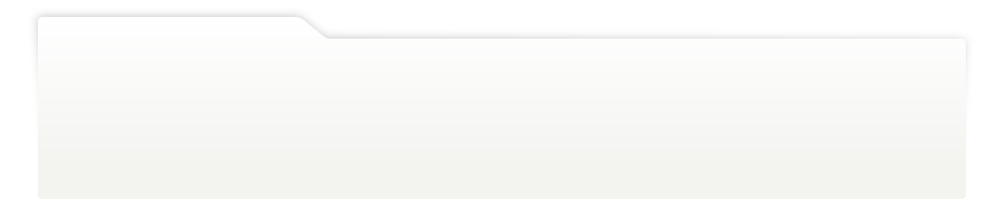
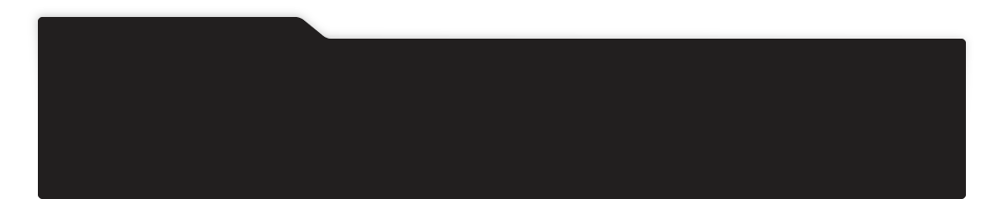
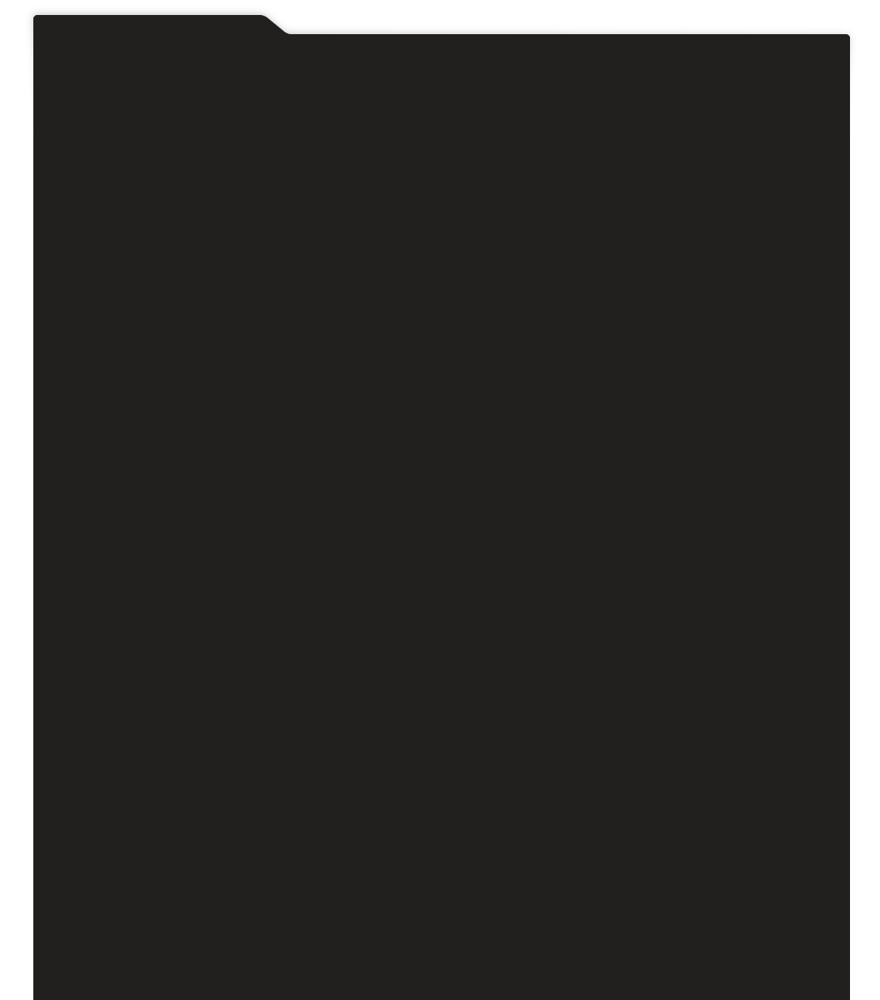
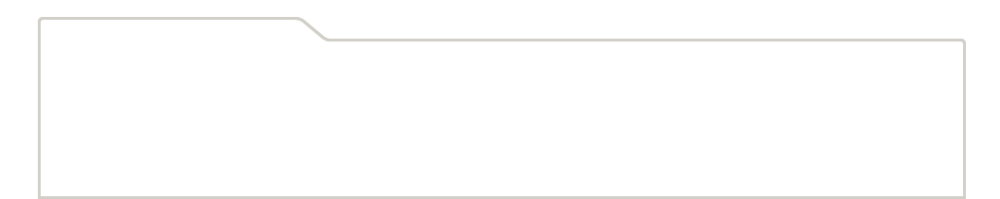
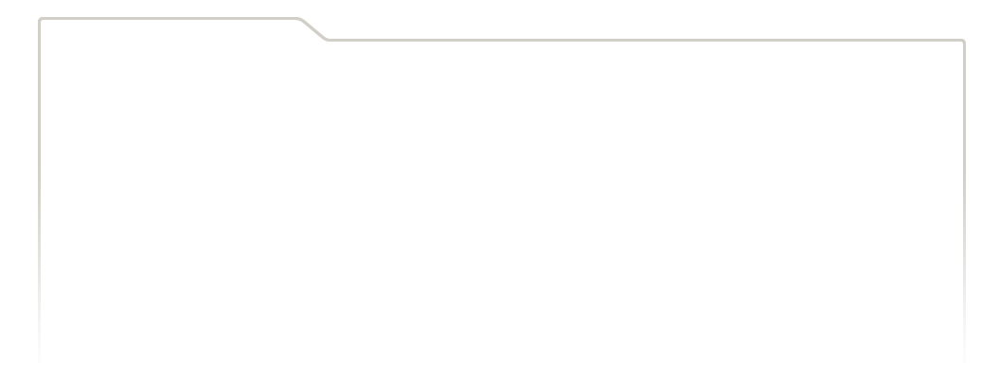
...
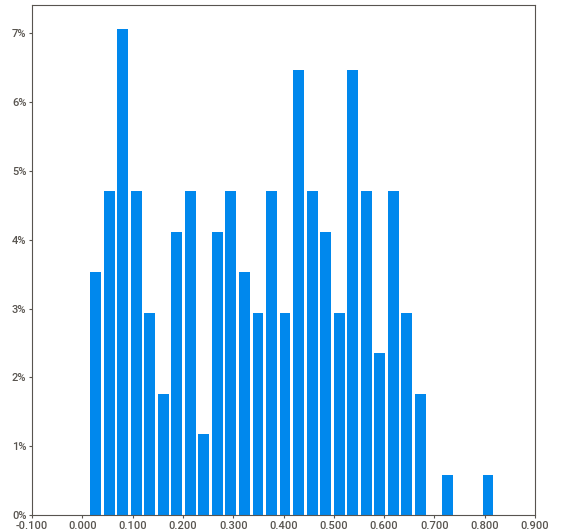
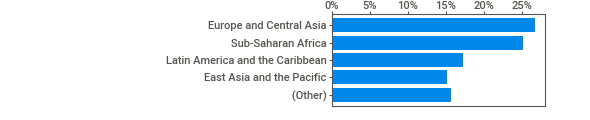
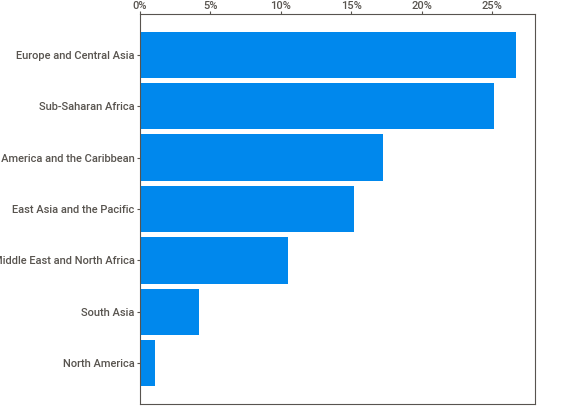
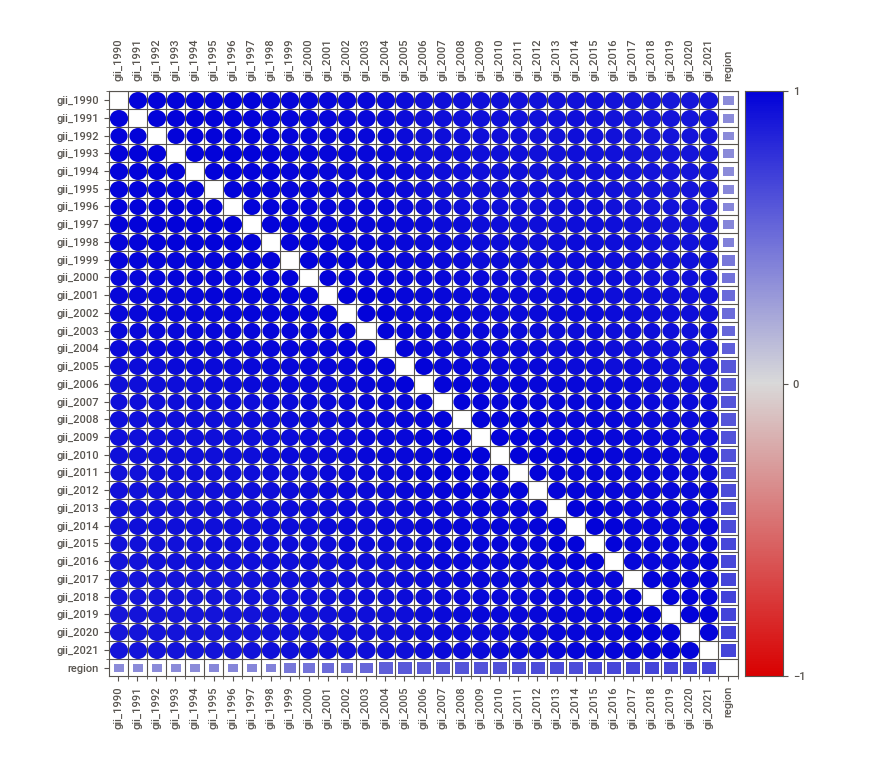
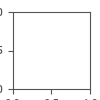

In [9]:
# Membuat report
report = sv.analyze(gii_series)

# Visualisasi report
#report.show_html()
report.show_notebook()

In [10]:
dfc = gii_series.copy()

In [11]:
# Mengubah nama kolom gii menjadi tahun saja

dfc.columns = dfc.columns.str.replace('gii_', '')

In [12]:
# Mencari nilai GII tertinggi dan terendah di tiap tahunnya berdasarkan region
df_max = dfc.max().reset_index()
df_max['region'] = dfc['region']  # Menambahkan kolom "region" dari dataframe awal

df_min = dfc.min().reset_index()
df_min['region'] = dfc['region']  # Menambahkan kolom "region" dari dataframe awal

# Plot line chart untuk nilai GII tertinggi
fig_max = px.line(df_max, x='index', y=df_max.columns[1:], title='Nilai GII Tertinggi Berdasarkan Region', 
                  hover_data={'index': False, 'value': ':.3f', 'variable': False, 'region': True})
fig_max.update_layout(xaxis_title='Tahun', yaxis_title='Nilai GII')
fig_max.update_traces(mode='lines+markers', showlegend=False)
fig_max.show()

# Plot line chart untuk nilai GII terendah
fig_min = px.line(df_min, x='index', y=df_min.columns[1:], title='Nilai GII Terendah Berdasarkan Region', 
                  hover_data={'index': False, 'value': ':.3f', 'variable': False, 'region': True})
fig_min.update_layout(xaxis_title='Tahun', yaxis_title='Nilai GII')
fig_min.update_traces(mode='lines+markers', showlegend=False)
fig_min.show()

In [13]:
dfc2 = dfc.drop(['country'], axis=1)

In [14]:
# Mencari nilai GII tertinggi dan terendah di tiap tahunnya berdasarkan region
df_max = dfc2.max().reset_index()
df_min = dfc2.min().reset_index()

# Menampilkan nilai GII tertinggi di tiap tahunnya berdasarkan region
print("Nilai GII Tertinggi:")
print(df_max)

# Menampilkan nilai GII terendah di tiap tahunnya berdasarkan region
print("\nNilai GII Terendah:")
print(df_min)

Nilai GII Tertinggi:
   index      0
0   1990  0.811
1   1991  0.806
2   1992  0.803
3   1993  0.802
4   1994  0.800
5   1995  0.799
6   1996  0.798
7   1997  0.796
8   1998  0.812
9   1999  0.807
10  2000  0.805
11  2001  0.803
12  2002  0.802
13  2003  0.822
14  2004  0.821
15  2005  0.799
16  2006  0.800
17  2007  0.799
18  2008  0.798
19  2009  0.798
20  2010  0.798
21  2011  0.799
22  2012  0.800
23  2013  0.802
24  2014  0.806
25  2015  0.815
26  2016  0.810
27  2017  0.808
28  2018  0.806
29  2019  0.785
30  2020  0.784
31  2021  0.820

Nilai GII Terendah:
   index      0
0   1990  0.090
1   1991  0.090
2   1992  0.094
3   1993  0.090
4   1994  0.083
5   1995  0.075
6   1996  0.067
7   1997  0.063
8   1998  0.060
9   1999  0.059
10  2000  0.060
11  2001  0.056
12  2002  0.054
13  2003  0.049
14  2004  0.048
15  2005  0.047
16  2006  0.047
17  2007  0.047
18  2008  0.048
19  2009  0.049
20  2010  0.049
21  2011  0.044
22  2012  0.042
23  2013  0.039
24  2014  0.035
25  2015  0.03

In [15]:
# Mencari nilai GII tertinggi dan terendah di tiap tahunnya berdasarkan region
df_max = dfc.max().reset_index().rename(columns={'index': 'year', 0: 'max_GII'})
df_min = dfc.min().reset_index().rename(columns={'index': 'year', 0: 'min_GII'})

# Menggabungkan DataFrame df_max dengan kolom 'region' dan 'country' dari DataFrame dfc
df_max = pd.concat([df_max, dfc[['region', 'country']]], axis=1)
df_min = pd.concat([df_min, dfc[['region', 'country']]], axis=1)

# Membuat mapping region ke nilai numerik
region_to_numeric = {region: i for i, region in enumerate(dfc['region'].unique())}

# Mengonversi region menjadi nilai numerik dalam DataFrame df_max dan df_min
df_max['region_numeric'] = df_max['region'].map(region_to_numeric)
df_min['region_numeric'] = df_min['region'].map(region_to_numeric)

# Membuat visualisasi nilai GII tertinggi dengan tooltip
fig_max = go.Figure(data=[
    go.Bar(x=df_max['year'][1:], y=df_max['max_GII'][1:],
           hovertemplate='Region: %{text}<br>Country: %{customdata[1]}<br>GII Value: %{customdata[0]}<extra></extra>',
           name='Tertinggi', marker=dict(color=df_max['region_numeric'][1:]),
           text=df_max['region'][1:], textposition='auto', customdata=df_max[['max_GII', 'country']][1:])
])
fig_max.update_layout(
    title='Nilai GII Tertinggi di Tiap Tahun',
    xaxis=dict(title='Tahun', tickmode='linear', tick0=1990, dtick=1),
    yaxis=dict(title='Nilai GII'),
    barmode='group'
)
fig_max.show()

# Membuat visualisasi nilai GII terendah dengan tooltip
fig_min = go.Figure(data=[
    go.Bar(x=df_min['year'][1:], y=df_min['min_GII'][1:],
           hovertemplate='Region: %{text}<br>Country: %{customdata[1]}<br>GII Value: %{customdata[0]}<extra></extra>',
           name='Terendah', marker=dict(color=df_min['region_numeric'][1:]),
           text=df_min['region'][1:], textposition='auto', customdata=df_min[['min_GII', 'country']][1:])
])
fig_min.update_layout(
    title='Nilai GII Terendah di Tiap Tahun',
    xaxis=dict(title='Tahun', tickmode='linear', tick0=1990, dtick=1),
    yaxis=dict(title='Nilai GII'),
    barmode='group'
)
fig_min.show()


In [16]:
df_melted = dfc.melt(id_vars='region', value_vars=[str(year) for year in range(1990, 2022)], var_name='year', value_name='gii')

# Menghapus baris dengan nilai GII yang kosong
df_melted = df_melted.dropna(subset=['gii'])

# Mengubah tipe data kolom 'year' menjadi integer
df_melted['year'] = df_melted['year'].astype(int)

# Groupby region dan year, lalu ambil rata-rata
df_grouped = df_melted.groupby(['region', 'year']).mean().reset_index()

In [17]:
# Membuat line chart interaktif untuk setiap region
fig = px.line(df_grouped, x='year', y='gii', color='region', title='Average GII by Region Over Time')

# Menyesuaikan tampilan visualisasi
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Average GII',
    legend_title='Region',
    yaxis=dict(),
    width=1000  # Lebar frame dalam piksel
)

# Menampilkan visualisasi
fig.show()

Berdasarkan grafik diatas, dapat ditarik beberapa insights:
- Dari tahun 1990 hingga 2021 trend nilai Gender Inequality Index (GII) disemua region turun yang mana hal ini menunjukkan bahwa semakin lama ketimpangan berbasis gender dalam tiga dimensi (kesehatan reproduksi, pemberdayaan, dan pasar tenaga) kerja semakin berkurang yang berarti hal ini merupakan hal yang sangat positif karena semakin lama ketimpangan secara garis besar, semakin berkurang
- Region yang memiliki nilai GII yang konsisten diangka rendah adalah North America yang didalamnya terdapat negara Kanada dan Amerika Serikat
- Mulai dari tahun 1997 sampai 2021 regin Sub-Saharan Africa tetapberada diurutan pertama dengan nilai GII tertinggi, walaupun secara garis besar angkanya menurut tiap tahunnya. Namun, jika dibandingkan dengan region lain, hanya region tersebut yang nilai GII nya mencapai lebih dari 0.5. Region ini berisi negara: Angola, Burundi, Benin, Burkina Faso, Botswana, Central African Republic, Côte d'Ivoire, Cameroon, Congo (Democratic Republic of the), Congo, Comoros, Cabo Verde, Eritrea, Ethiopia, Gabon, Ghana, Guinea, Gambia, Guinea-Bissau, Equatorial Guinea, Kenya, Liberia, Lesotho, Madagascar, Mali, Mozambique, Mauritania, Mauritius, Malawi, Namibia, Niger, Nigeria, Rwanda, Sudan, Senegal, Sierra Leone, Somalia, South Sudan, Sao Tome and Principe, Eswatini (Kingdom of), Seychelles, Chad, Togo, Tanzania (United Republic of), Uganda, South Africa, Zambia, Zimbabwe.
- Kita akan melihat lebih lanjut mengenai GII pada tahun 2021


## EDA (Exploratory Data Analysis) pada dataset Anda:

### 1. **Memahami Data:**
- Baca dan pahami dokumentasi dataset, termasuk deskripsi variabel dan informasi konteks.
- Periksa struktur dataset (jumlah baris dan kolom) menggunakan shape atau info().
### 2. **Menangani Missing Values (NaN):**
- Identifikasi kolom yang memiliki nilai NaN menggunakan metode isnull() atau info().
- Evaluasi tingkat missing values dalam setiap kolom menggunakan isnull().sum() atau missingno library.
- Pilih metode penanganan NaN yang sesuai, seperti menghapus baris/kolom dengan banyak missing values atau menggunakan teknik imputasi seperti KNNImputer.
- Lakukan penanganan missing values sebelum melakukan analisis lebih lanjut.
### 3. **Menangani Outliers:**
- Identifikasi kolom yang mungkin mengandung outliers menggunakan metode statistik seperti quartile, z-score, atau visualisasi.
- Evaluasi distribusi data menggunakan histogram, box plot, atau visualisasi lainnya.
- Pilih metode penanganan outliers yang sesuai, seperti menghapus outliers ekstrem atau menggunakan teknik transformasi data.
- Lakukan penanganan outliers jika diperlukan sebelum melanjutkan analisis.
### 4. **Eksplorasi dan Visualisasi Data:**
- Lakukan eksplorasi data untuk memahami karakteristik, hubungan, dan pola yang ada.
- Gunakan metode statistik deskriptif untuk mendapatkan gambaran umum tentang variabel-variabel dalam dataset.
- Visualisasikan data menggunakan plot seperti histogram, box plot, scatter plot, bar plot, atau heatmap untuk memperoleh wawasan yang lebih dalam tentang hubungan dan pola dalam data.
- Identifikasi korelasi antar variabel menggunakan matriks korelasi atau plot seperti scatter plot maupun heat map.
### 5. **Analisis Lebih Lanjut:**
- Lanjutkan analisis sesuai dengan tujuan dan pertanyaan penelitian Anda.
- Gunakan teknik seperti grouping, agregasi, atau analisis statistik lanjutan untuk mendapatkan wawasan yang lebih dalam tentang data.
### 6. **Kesimpulan:**
- Ringkas temuan dan kesimpulan penting dari analisis yang telah dilakukan.
- Berikan rekomendasi atau tindakan yang dapat diambil berdasarkan hasil EDA.

# Gender Inequality Index 2021

# Data Description
1. **Gender Inequality Index:** A composite measure reflecting inequality in achievement between women and men in three dimensions: reproductive health, empowerment and the labour market. See Technical note 4 at http://hdr.undp.org/sites/default/files/hdr2022_technical_notes.pdf for details on how the Gender Inequality Index is calculated.

2. **Maternal mortality ratio:** Number of deaths due to pregnancy-related causes per 100,000 live births.

3. **Adolescent birth rate:** Number of births to women ages 15–19 per 1,000 women ages 15–19.

4. **Share of seats in parliament:** Proportion of seats held by women in the national parliament expressed as a percentage of total seats. For countries with a bicameral legislative system, the share of seats is calculated based on both houses.

5. **Population with at least some secondary education:** Percentage of the population ages 25 and older that has reached (but not necessarily completed) a secondary level of education.

6. **Labour force participation rate:** Proportion of the working-age population (ages 15 and older) that engages in the labour market, either by working or actively looking for work, expressed as a percentage of the working-age population.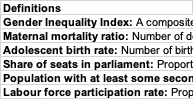

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import klib
import plotly.figure_factory as ff
import sweetviz as sv

from pandas_profiling import ProfileReport
from jupyter_datatables import init_datatables_mode
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [19]:
df = pd.read_excel('gender_inequality_index.xlsx')
df.head()

,HDI rank,Country,Human Development,GII Value,GII Rank,Maternal mortality ratio,Adolescent birth rate,Share of seats in parliament,F_secondary_edu,M_secondary_edu,F_labour_force,M_labour_force
0,1,Switzerland,Very High,0.018,3.0,5.0,2.212,39.837398,96.858673,97.533417,61.728,72.705
1,2,Norway,Very High,0.016,2.0,2.0,2.336,44.970414,99.094223,99.283562,60.294,71.950
2,3,Iceland,Very High,0.043,8.0,4.0,5.395,47.619048,99.768417,99.662552,61.671,70.463
3,4,"Hong Kong, China (SAR)",Very High,NaN,NaN,NaN,1.584,NaN,77.100433,83.368141,53.524,65.771
4,5,Australia,Very High,0.073,19.0,6.0,8.096,37.885463,94.580063,94.430069,61.057,70.547


## 1.  Data Understanding

                                             |      | [  0%]   00:00 -> (? left)


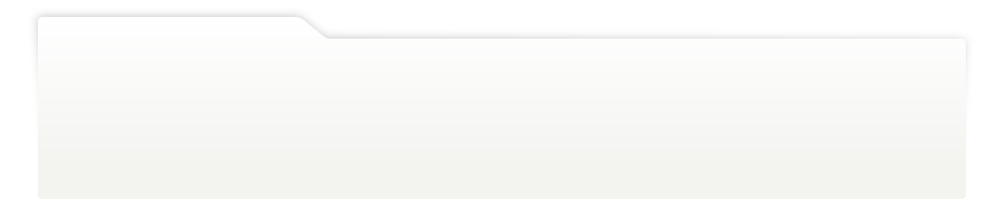
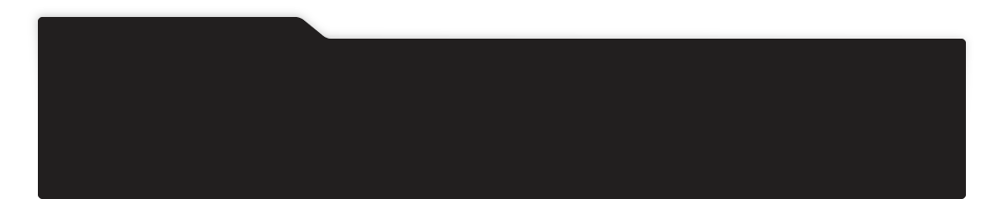
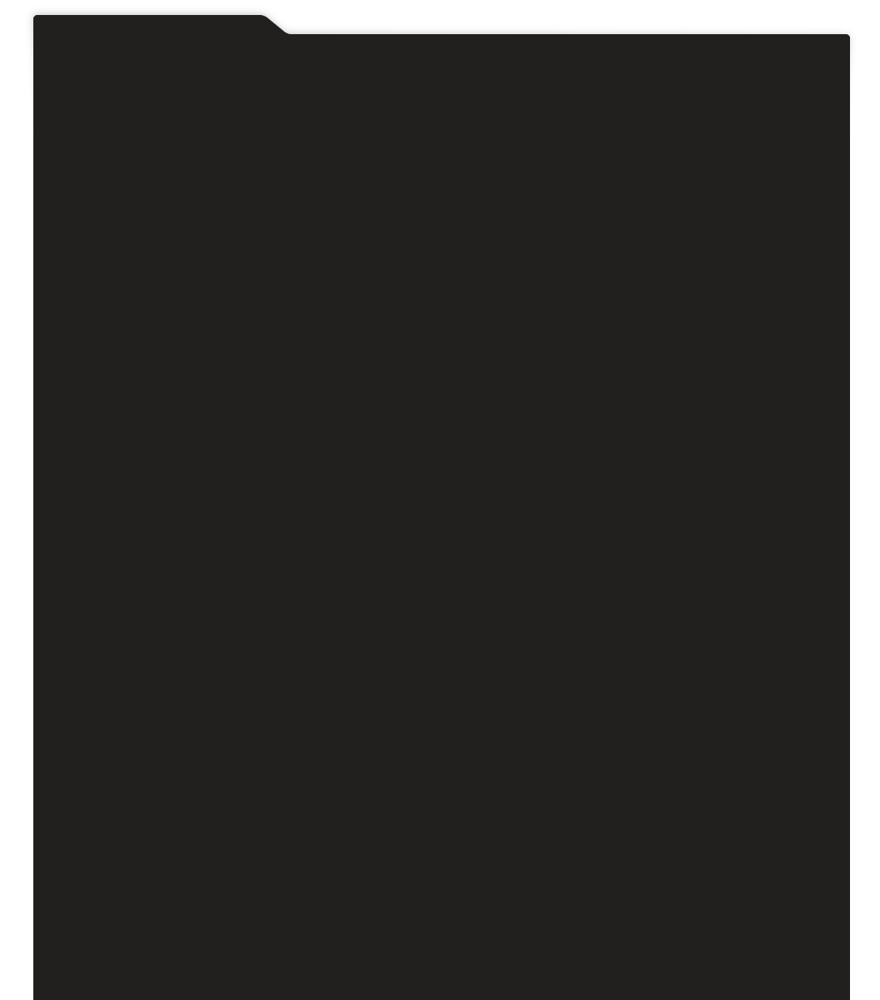
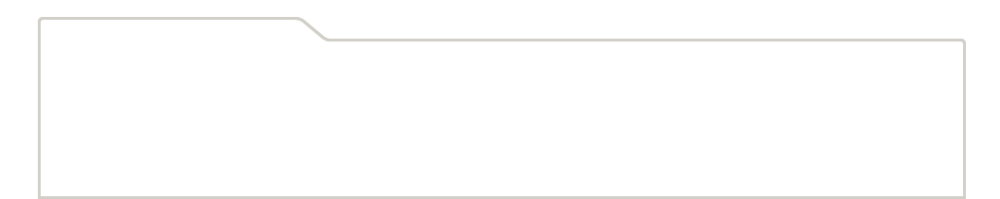
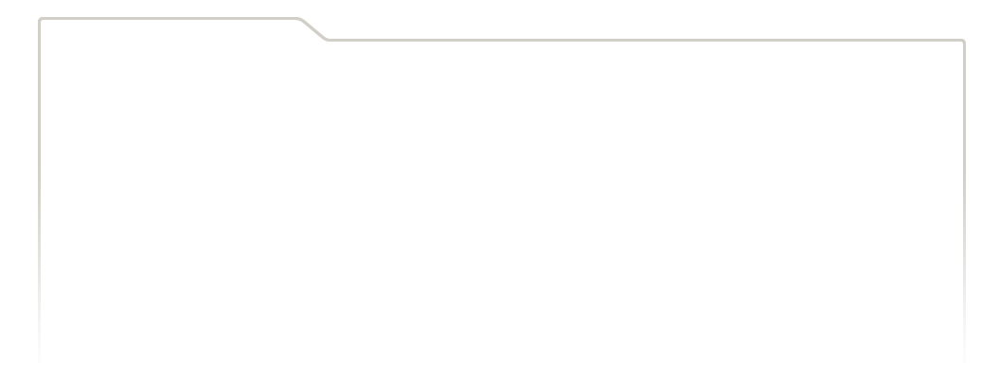
...
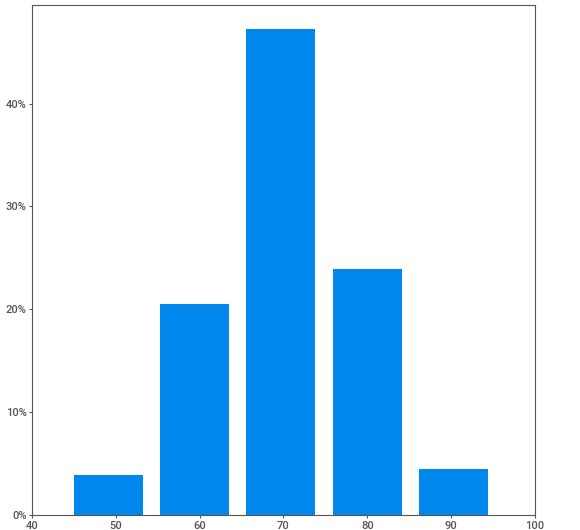
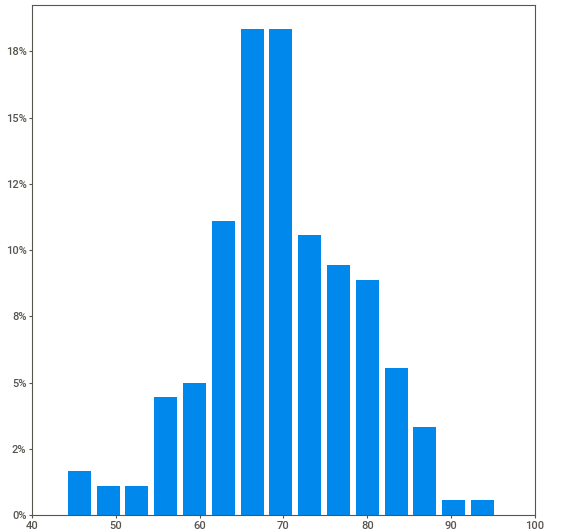
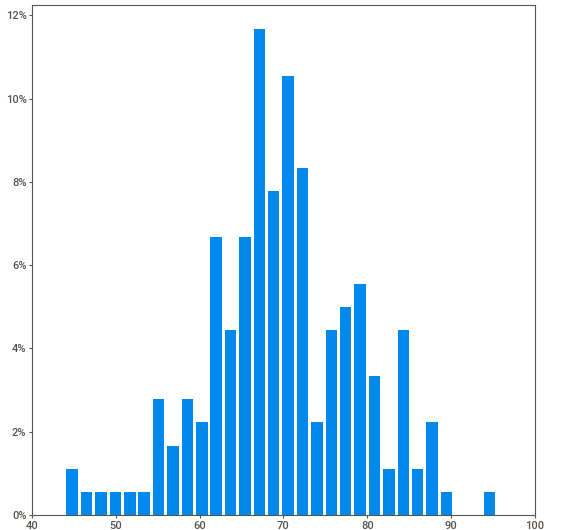
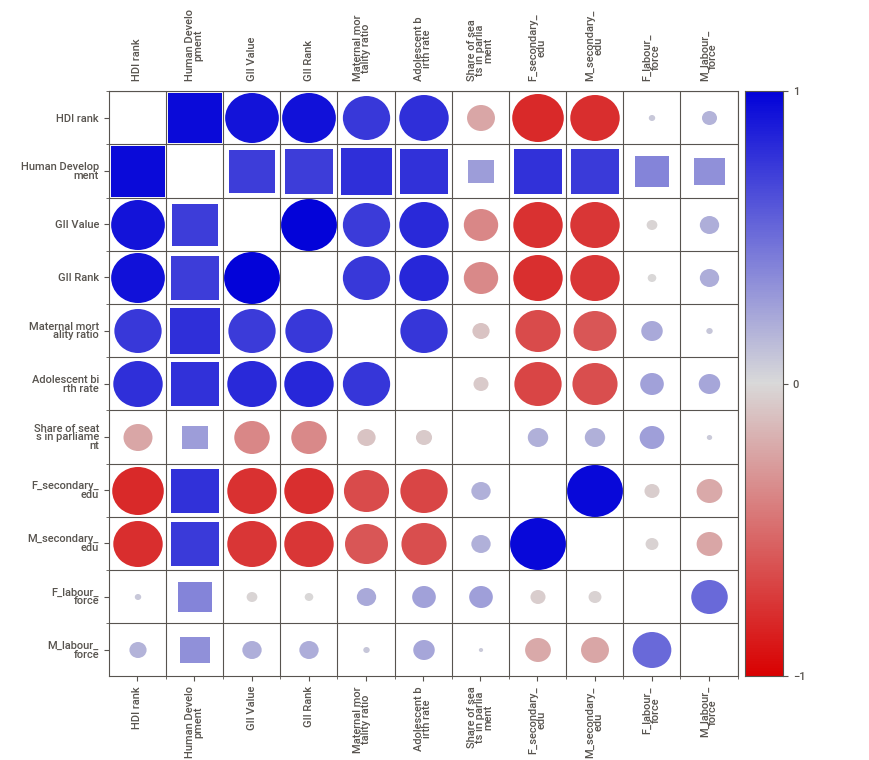
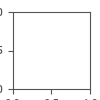

In [20]:
# Membuat report
report = sv.analyze(df)

# Visualisasi report
#report.show_html()
report.show_notebook()

In [21]:
print("Jumlah baris dan kolom dalam dataset:", df.shape)
print("Info dataset:")
print(df.info())

Jumlah baris dan kolom dalam dataset: (195, 12)
Info dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 12 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   HDI rank                      195 non-null    int64  
 1   Country                       195 non-null    object 
 2   Human Development             195 non-null    object 
 3   GII Value                     170 non-null    float64
 4   GII Rank                      170 non-null    float64
 5   Maternal mortality ratio      184 non-null    float64
 6   Adolescent birth rate         195 non-null    float64
 7   Share of seats in parliament  193 non-null    float64
 8   F_secondary_edu               177 non-null    float64
 9   M_secondary_edu               177 non-null    float64
 10  F_labour_force                180 non-null    float64
 11  M_labour_force                180 non-null    float64
dtypes:

## 2. Data Cleaning

In [22]:
# Ubah kolom menjadi huruf kecil
df = df.rename(columns=str.lower)

In [23]:
# Check apakah ada data duplikat
df.duplicated().any()

False

In [24]:
# Identifikasi kolom dengan nilai NaN
kolom_nan = df.columns[df.isnull().any()]
print("Kolom dengan nilai NaN:", kolom_nan)

Kolom dengan nilai NaN: Index(['gii value', 'gii rank', 'maternal mortality ratio',
       'share of seats in parliament', 'f_secondary_edu', 'm_secondary_edu',
       'f_labour_force', 'm_labour_force'],
      dtype='object')


In [25]:
df[df.isna().any(axis=1)]

,hdi rank,country,human development,gii value,gii rank,maternal mortality ratio,adolescent birth rate,share of seats in parliament,f_secondary_edu,m_secondary_edu,f_labour_force,m_labour_force
3,4,"Hong Kong, China (SAR)",Very High,NaN,NaN,NaN,1.584,NaN,77.100433,83.368141,53.524,65.771
15,16,Liechtenstein,Very High,NaN,NaN,NaN,3.019,28.000000,NaN,NaN,NaN,NaN
39,40,Andorra,Very High,NaN,NaN,NaN,5.887,46.428571,70.665854,72.422097,NaN,NaN
43,44,San Marino,Very High,NaN,NaN,NaN,3.751,33.333333,81.758240,84.284729,NaN,NaN
68,68,Grenada,High,NaN,NaN,25.0,32.720,32.142857,NaN,NaN,NaN,NaN
70,71,Antigua and Barbuda,High,NaN,NaN,42.0,33.110,31.428571,NaN,NaN,NaN,NaN
71,72,Seychelles,High,NaN,NaN,53.0,53.444,22.857143,NaN,NaN,NaN,NaN
74,75,Saint Kitts and Nevis,High,NaN,NaN,NaN,38.154,25.000000,NaN,NaN,NaN,NaN
81,80,Palau,High,NaN,NaN,NaN,42.520,6.896552,96.889137,97.331322,NaN,NaN
101,102,Dominica,High,NaN,NaN,NaN,38.490,34.375000,NaN,NaN,NaN,NaN


GridSpec(6, 6)

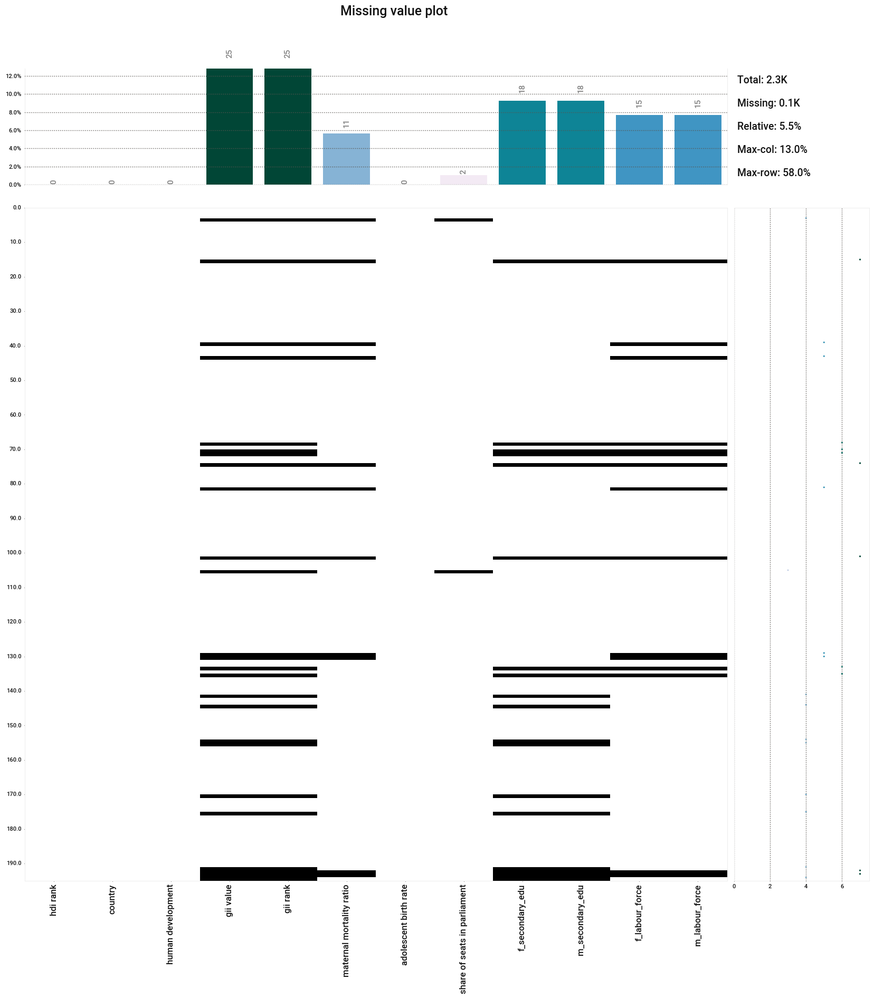

In [26]:
klib.missingval_plot(df)

In [27]:
# Evaluasi tingkat missing values dalam setiap kolom
print("Jumlah missing values dalam setiap kolom:")
print(df.isnull().sum())

Jumlah missing values dalam setiap kolom:
hdi rank                         0
country                          0
human development                0
gii value                       25
gii rank                        25
maternal mortality ratio        11
adolescent birth rate            0
share of seats in parliament     2
f_secondary_edu                 18
m_secondary_edu                 18
f_labour_force                  15
m_labour_force                  15
dtype: int64


In [28]:
# Menghapus nilai NaN
df_clean = df.dropna()

In [29]:
print("Jumlah missing values dalam setiap kolom:")
print(df_clean.isnull().sum())

Jumlah missing values dalam setiap kolom:
hdi rank                        0
country                         0
human development               0
gii value                       0
gii rank                        0
maternal mortality ratio        0
adolescent birth rate           0
share of seats in parliament    0
f_secondary_edu                 0
m_secondary_edu                 0
f_labour_force                  0
m_labour_force                  0
dtype: int64


In [30]:
df_clean.head()

,hdi rank,country,human development,gii value,gii rank,maternal mortality ratio,adolescent birth rate,share of seats in parliament,f_secondary_edu,m_secondary_edu,f_labour_force,m_labour_force
0,1,Switzerland,Very High,0.018,3.0,5.0,2.212,39.837398,96.858673,97.533417,61.728,72.705
1,2,Norway,Very High,0.016,2.0,2.0,2.336,44.970414,99.094223,99.283562,60.294,71.950
2,3,Iceland,Very High,0.043,8.0,4.0,5.395,47.619048,99.768417,99.662552,61.671,70.463
4,5,Australia,Very High,0.073,19.0,6.0,8.096,37.885463,94.580063,94.430069,61.057,70.547
5,6,Denmark,Very High,0.013,1.0,4.0,1.908,39.664804,95.067261,95.238098,57.721,66.653


In [31]:
# Ubah tipe data pada kolom yang tidak sesuai
df_clean[['gii rank', 'maternal mortality ratio']] = df_clean[['gii rank', 'maternal mortality ratio']].astype(int)


# Menampilkan informasi tipe data setelah perubahan
print(df_clean.dtypes)

hdi rank                          int64
country                          object
human development                object
gii value                       float64
gii rank                          int64
maternal mortality ratio          int64
adolescent birth rate           float64
share of seats in parliament    float64
f_secondary_edu                 float64
m_secondary_edu                 float64
f_labour_force                  float64
m_labour_force                  float64
dtype: object


#### *Setelah mengecek data, ditemukan bahwa:*
- Data terdiri dari 195 baris dan 12 kolom
- Terdapat 9 kolom dengan tipe data float, 2 kolom dengan tipe data string dan 1 kolom dengan tipe data integer
- Tidak ada data yang duplikat
- Terdapat 8 kolom dengan data yang kosong (NaN values), maka dari itu dilakukan dropna untuk membuang baris yang mengandung NaN values
- Melakukan perubahan tipe data yang tidak sesuai, pada kolom 'gii rank' dan 'maternal mortality ratio' dari float menjadi integer.

## 3. Statistik Deskriptif

In [32]:
# Memisahkan kolom-kolom berdasarkan tipe datanya
data_numerik = df_clean.select_dtypes(['float64','int64']).columns
data_string = df_clean.select_dtypes(['object']).columns

In [33]:
df_stat = df_clean.copy()

In [34]:
df_stat.describe()

,hdi rank,gii value,gii rank,maternal mortality ratio,adolescent birth rate,share of seats in parliament,f_secondary_edu,m_secondary_edu,f_labour_force,m_labour_force
count,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000
mean,94.988235,0.344376,85.376471,157.188235,44.843618,25.301864,62.077497,66.548596,50.352676,70.023882
std,55.928630,0.197105,49.210206,234.061565,39.124426,12.352110,29.861243,26.745219,15.300506,8.469920
min,1.000000,0.013000,1.000000,2.000000,1.908000,0.000000,6.395730,13.046886,5.995000,43.932000
25%,47.250000,0.177500,43.250000,11.250000,10.667750,16.700000,36.911476,44.285603,42.696000,65.233250
50%,93.000000,0.363000,85.500000,46.000000,34.648500,23.943966,69.212936,70.716056,52.123000,69.562000
75%,143.750000,0.505750,127.750000,184.500000,65.457750,34.533223,90.113731,92.562222,60.348000,75.393750
max,191.000000,0.820000,170.000000,1150.000000,170.462000,55.660377,100.000000,100.000000,82.501000,95.456000


In [35]:
df_stat[data_string].describe()

,country,human development
count,170,170
unique,170,4
top,Switzerland,Very High
freq,1,62


In [36]:
# Menghitung nilai rata-rata dan median dari kolom "share of seats in parliament"
seats_mean = df_clean['share of seats in parliament'].mean()
seats_median = df_clean['share of seats in parliament'].median()
print("Mean Share of Seats in Parliament:", seats_mean)
print("Median Share of Seats in Parliament:", seats_median)

Mean Share of Seats in Parliament: 25.301864339094124
Median Share of Seats in Parliament: 23.943965515000002


In [37]:
# Negara dengan "gii value" tertinggi dan terendah
highest_gii = df_stat[df_stat['gii value'] == df_stat['gii value'].max()]['country'].iloc[0]
lowest_gii = df_stat[df_stat['gii value'] == df_stat['gii value'].min()]['country'].iloc[0]
print("Country with the highest GII value:", highest_gii)
print("Country with the lowest GII value:", lowest_gii)

Country with the highest GII value: Yemen
Country with the lowest GII value: Denmark


In [38]:
# Mengganti nilai "Very High", "High", "Medium", "Low" menjadi skala numerik
df_stat['human development'] = df_stat['human development'].replace({
    'Very High': 4,
    'High': 3,
    'Medium': 2,
    'Low': 1
})

# Mengisi nilai yang hilang dengan nilai rata-rata
mean_hdi = df_stat['human development'].mean()
df_clean['human development'].fillna(mean_hdi, inplace=True)

# Membuat kelompok berdasarkan kolom "human development" dengan nilai yang sudah diisi
income_groups = pd.cut(df_stat['human development'], bins=3, labels=['Low', 'Medium', 'High'])
gii_mean_by_income = df_stat.groupby(income_groups)['gii value'].mean()
print(gii_mean_by_income)

human development
Low       0.531470
Medium    0.341690
High      0.147032
Name: gii value, dtype: float64


In [39]:
# Rata-rata "f_secondary_edu" dan "m_secondary_edu"
f_secondary_mean = df_stat['f_secondary_edu'].mean()
m_secondary_mean = df_stat['m_secondary_edu'].mean()
print("Mean Female Secondary Education:", f_secondary_mean)
print("Mean Male Secondary Education:", m_secondary_mean)

Mean Female Secondary Education: 62.077497317129435
Mean Male Secondary Education: 66.54859597670593


In [40]:
# Rata-rata "f_labour_force" dan "m_labour_force"
f_lf_mean = df_stat['f_labour_force'].mean()
m_lf_mean = df_stat['m_labour_force'].mean()
print("Mean Female Labour Force:", f_lf_mean)
print("Mean Male Labour Force:", m_lf_mean)

Mean Female Labour Force: 50.35267647058824
Mean Male Labour Force: 70.0238823529412


## 4. Univariate Analysis

<AxesSubplot:xlabel='m_labour_force', ylabel='Density'>

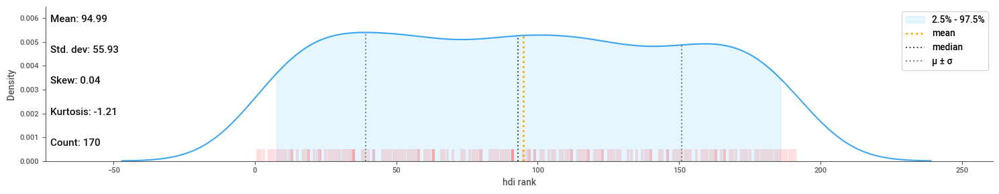

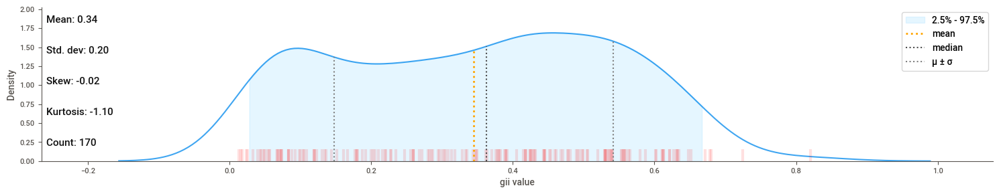

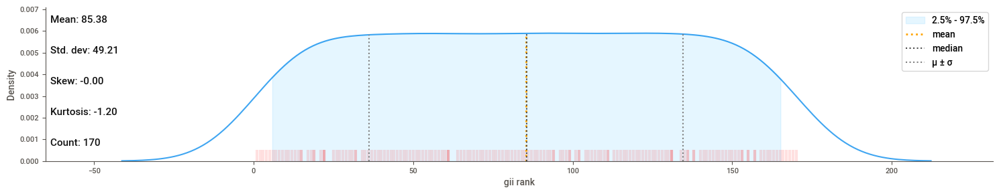

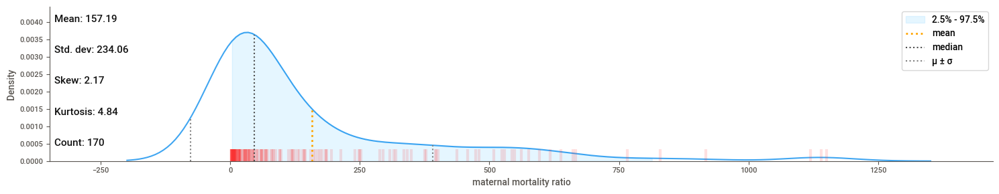

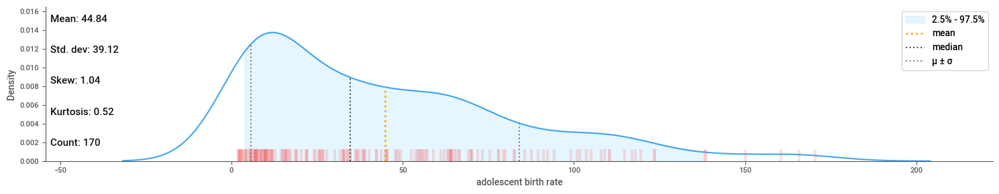

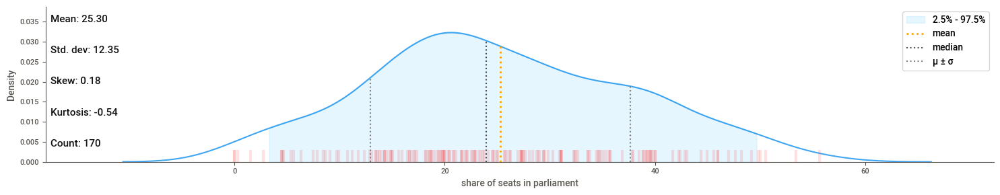

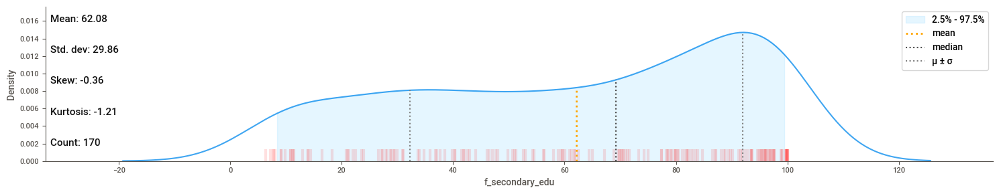

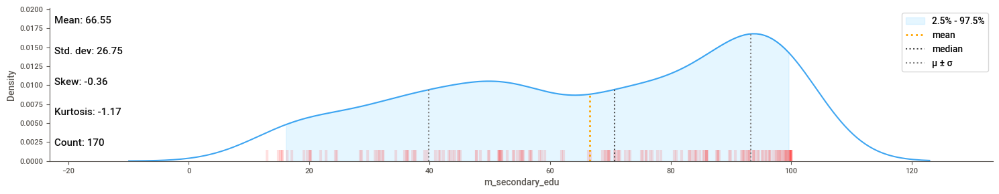

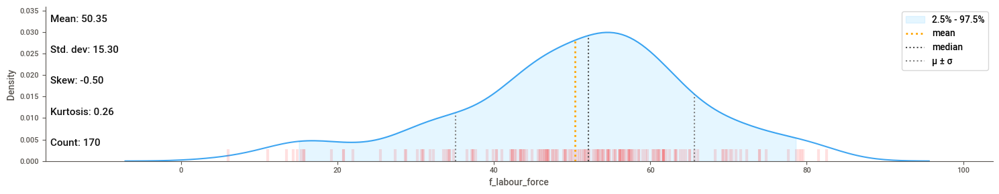

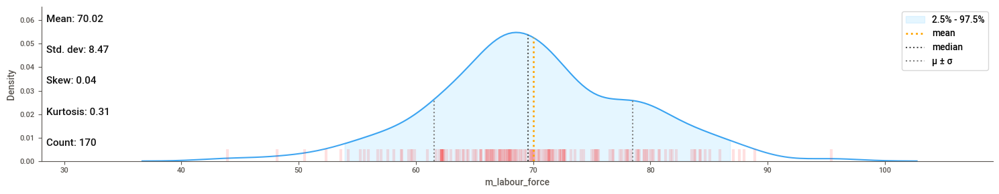

In [41]:
klib.dist_plot(df_clean)

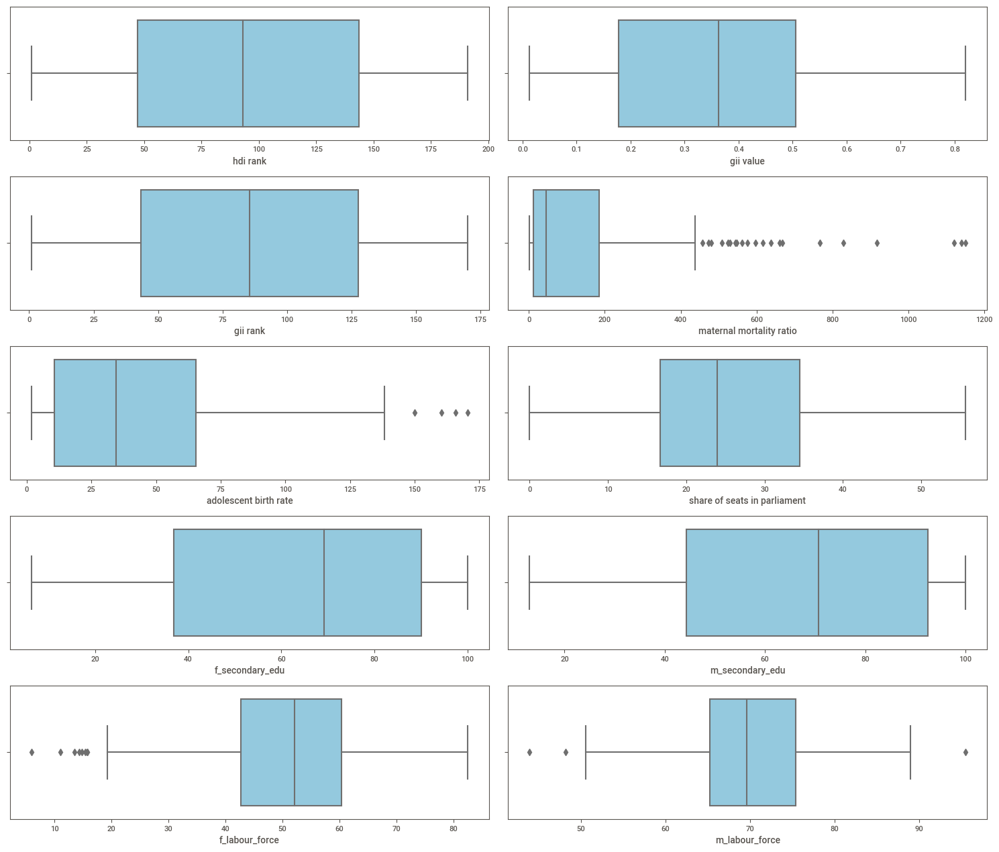

In [42]:
plt.figure(figsize=(15, 20))
for i in range(0, len(data_numerik)):
    plt.subplot(8, 2, i+1)
    sns.boxplot(x=df_clean[data_numerik[i]], color='skyblue',orient='v')
    plt.tight_layout()
plt.show()

#### *Berdasarkan boxplot, terdapat beberapa kolom yang memiliki outlier, yaitu:*
- maternal mortality ratio
- adolescent birth rate
- f_labour_force
- m_labour_force

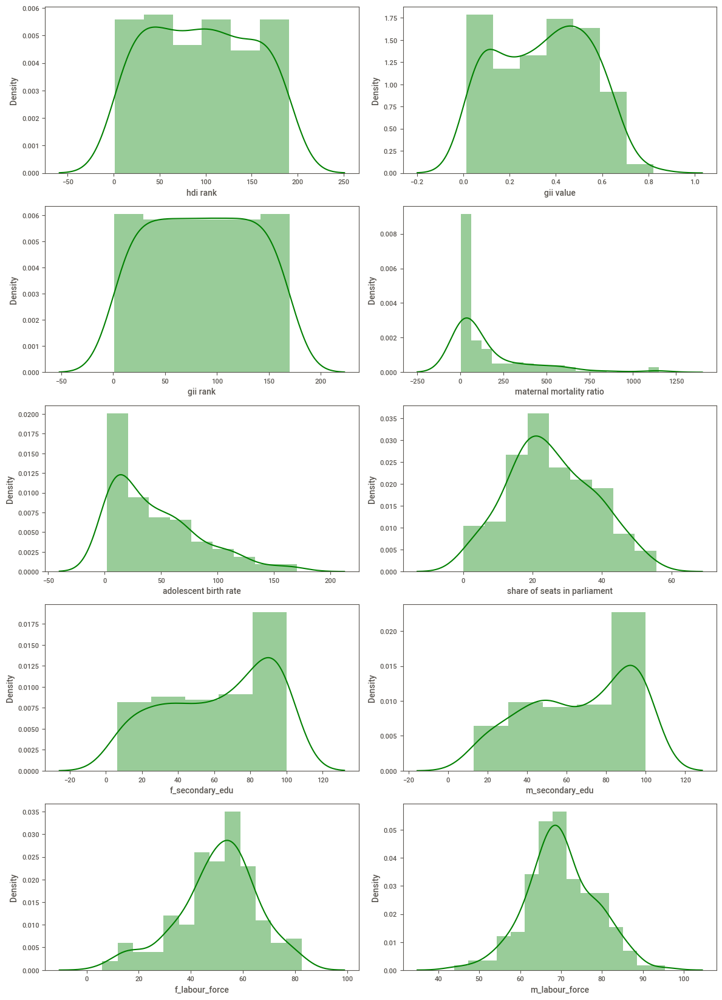

In [43]:
plt.figure(figsize=(12, 26))
for i in range(0, len(data_numerik)):
    plt.subplot(8, 2,i+1)
    sns.distplot(df_clean[data_numerik[i]], color='green')
    plt.tight_layout()

- Dari visualisasi diatas, ditemukan bahwa data memiliki kolom yang positive skewed, negative skewed dan normal distribution.
- Kolom yang memiliki positive skewed atau Right-Skewed (Mean > Median):
> 1. maternal mortality ratio
> 2. adolescent birth rate
- Kolom yang memiliki negative skewed atau Left-Skewed (Mean < Median):
> 1. f_secondary_edu
> 2. m_secondary_edu

In [44]:
# Human Development

dv1 = df_clean.groupby(['human development'])['hdi rank'].count().to_frame().rename(columns={'hdi rank':'count'}).reset_index()
dv1

,human development,count
0,High,42
1,Low,30
2,Medium,36
3,Very High,62


In [45]:
# The amount of Human Development in each category
fig = px.bar(dv1, x='human development', y='count', text='count')

# Customize the plot layout
fig.update_layout(
    title='Human Development by Count',
    xaxis_title='Human Development',
    yaxis_title='Count',
    height=400,
    width=600
)

# Add value labels to each bar
fig.update_traces(textposition='auto')

# Show the interactive plot
fig.show()


In [46]:
data = df_clean.copy()

# Create a dictionary to store the countries for each Human Development category
categories = data['human development'].unique()
country_dict = {category: [] for category in categories}

# Iterate over the rows and append countries to their respective categories
for index, row in data.iterrows():
    category = row['human development']
    country = row['country']
    country_dict[category].append(country)

# Print the countries for each Human Development category
for category, countries in country_dict.items():
    print(f"{category}:")
    print(", ".join(countries))
    print()


Very High:
Switzerland, Norway, Iceland, Australia, Denmark, Sweden, Ireland, Germany, Netherlands, Finland, Singapore, Belgium, New Zealand, Canada, Luxembourg, United Kingdom, Japan, Korea (Republic of), United States, Israel, Malta, Slovenia, Austria, United Arab Emirates, Spain, France, Cyprus, Italy, Estonia, Czechia, Greece, Poland, Bahrain, Lithuania, Saudi Arabia, Portugal, Latvia, Croatia, Chile, Qatar, Slovakia, Hungary, Argentina, Türkiye, Montenegro, Kuwait, Brunei Darussalam, Russian Federation, Romania, Oman, Bahamas, Kazakhstan, Trinidad and Tobago, Costa Rica, Uruguay, Belarus, Panama, Malaysia, Georgia, Mauritius, Serbia, Thailand

High:
Albania, Bulgaria, Barbados, Sri Lanka, Bosnia and Herzegovina, Iran (Islamic Republic of), Ukraine, North Macedonia, China, Dominican Republic, Moldova (Republic of), Cuba, Peru, Armenia, Mexico, Brazil, Colombia, Saint Vincent and the Grenadines, Maldives, Algeria, Azerbaijan, Tonga, Turkmenistan, Ecuador, Mongolia, Egypt, Tunisia, F

## 4. Menangani Outliers

In [116]:
dfo = df_clean.copy()

Dapat dilihat bahwa kolom **'maternal mortality ratio'** dan **'adolescent birth rate'** masih mengalami *positive skewed* (miring ke kanan), maka saya melakukan transformasi logaritmik digunakan untuk mengubah distribusi data yang skewed (miring) menjadi lebih mendekati distribusi normal. Fungsi `np.log1p()` digunakan dalam transformasi ini untuk menghindari masalah perhitungan logaritma pada nilai yang bernilai nol atau negatif. Dengan menggunakan `np.log1p()`, nilai nol akan menjadi nilai logaritma yang mendekati nol, dan nilai negatif akan memiliki logaritma negatif yang mendekati nol.


Transformasi logaritmik akan mengubahnya menjadi lebih simetris dan mendekati distribusi normal. Distribusi normal cenderung memudahkan analisis statistik dan pemodelan data karena asumsi beberapa metode analisis sering mengasumsikan distribusi normal.

## 5. Bivariate Analysis

In [117]:
dv = dfo.copy()

In [118]:
country_to_region = {
    'Switzerland': 'Europe and Central Asia',
    'Norway': 'Europe and Central Asia',
    'Iceland': 'Europe and Central Asia',
    'Hong Kong, China (SAR)': 'East Asia and the Pacific',
    'Australia': 'East Asia and the Pacific',
    'Denmark': 'Europe and Central Asia',
    'Sweden': 'Europe and Central Asia',
    'Ireland': 'Europe and Central Asia',
    'Germany': 'Europe and Central Asia',
    'Netherlands': 'Europe and Central Asia',
    'Finland': 'Europe and Central Asia',
    'Singapore': 'East Asia and the Pacific',
    'Belgium': 'Europe and Central Asia',
    'New Zealand': 'East Asia and the Pacific',
    'Canada': 'North America',
    'Liechtenstein': 'Europe and Central Asia',
    'Luxembourg': 'Europe and Central Asia',
    'United Kingdom': 'Europe and Central Asia',
    'Japan': 'East Asia and the Pacific',
    'Korea (Republic of)': 'East Asia and the Pacific',
    'United States': 'North America',
    'Israel': 'Middle East and North Africa',
    'Malta': 'Europe and Central Asia',
    'Slovenia': 'Europe and Central Asia',
    'Austria': 'Europe and Central Asia',
    'United Arab Emirates': 'Middle East and North Africa',
    'Spain': 'Europe and Central Asia',
    'France': 'Europe and Central Asia',
    'Cyprus': 'Europe and Central Asia',
    'Italy': 'Europe and Central Asia',
    'Estonia': 'Europe and Central Asia',
    'Czechia': 'Europe and Central Asia',
    'Greece': 'Europe and Central Asia',
    'Poland': 'Europe and Central Asia',
    'Bahrain': 'Middle East and North Africa',
    'Lithuania': 'Europe and Central Asia',
    'Saudi Arabia': 'Middle East and North Africa',
    'Portugal': 'Europe and Central Asia',
    'Latvia': 'Europe and Central Asia',
    'Andorra': 'Europe and Central Asia',
    'Croatia': 'Europe and Central Asia',
    'Chile': 'Latin America and the Caribbean',
    'Qatar': 'Middle East and North Africa',
    'San Marino': 'Europe and Central Asia',
    'Slovakia': 'Europe and Central Asia',
    'Hungary': 'Europe and Central Asia',
    'Argentina': 'Latin America and the Caribbean',
    'Türkiye': 'Europe and Central Asia',
    'Montenegro': 'Europe and Central Asia',
    'Kuwait': 'Middle East and North Africa',
    'Brunei Darussalam': 'East Asia and the Pacific',
    'Russian Federation': 'Europe and Central Asia',
    'Romania': 'Europe and Central Asia',
    'Oman': 'Middle East and North Africa',
    'Bahamas': 'Latin America and the Caribbean',
    'Kazakhstan': 'Europe and Central Asia',
    'Trinidad and Tobago': 'Latin America and the Caribbean',
    'Costa Rica': 'Latin America and the Caribbean',
    'Uruguay': 'Latin America and the Caribbean',
    'Belarus': 'Europe and Central Asia',
    'Panama': 'Latin America and the Caribbean',
    'Malaysia': 'East Asia and the Pacific',
    'Georgia': 'Europe and Central Asia',
    'Mauritius': 'Sub-Saharan Africa',
    'Serbia': 'Europe and Central Asia',
    'Thailand': 'East Asia and the Pacific',
    'Albania': 'Europe and Central Asia',
    'Bulgaria': 'Europe and Central Asia',
    'Grenada': 'Latin America and the Caribbean',
    'Barbados': 'Latin America and the Caribbean',
    'Antigua and Barbuda': 'Latin America and the Caribbean',
    'Seychelles': 'Sub-Saharan Africa',
    'Sri Lanka': 'South Asia',
    'Bosnia and Herzegovina': 'Europe and Central Asia',
    'Saint Kitts and Nevis': 'Latin America and the Caribbean',
    'Iran (Islamic Republic of)': 'Middle East and North Africa',
    'Ukraine': 'Europe and Central Asia',
    'North Macedonia': 'Europe and Central Asia',
    'China': 'East Asia and the Pacific',
    'Dominican Republic': 'Latin America and the Caribbean',
    'Moldova (Republic of)': 'Europe and Central Asia',
    'Palau': 'East Asia and the Pacific',
    'Cuba': 'Latin America and the Caribbean',
    'Peru': 'Latin America and the Caribbean',
    'Armenia': 'Europe and Central Asia',
    'Mexico': 'Latin America and the Caribbean',
    'Brazil': 'Latin America and the Caribbean',
    'Colombia': 'Latin America and the Caribbean',
    'Saint Vincent and the Grenadines': 'Latin America and the Caribbean',
    'Maldives': 'South Asia',
    'Algeria': 'Middle East and North Africa',
    'Azerbaijan': 'Europe and Central Asia',
    'Tonga': 'East Asia and the Pacific',
    'Turkmenistan': 'Europe and Central Asia',
    'Ecuador': 'Latin America and the Caribbean',
    'Mongolia': 'East Asia and the Pacific',
    'Egypt': 'Middle East and North Africa',
    'Tunisia': 'Middle East and North Africa',
    'Fiji': 'East Asia and the Pacific',
    'Suriname': 'Latin America and the Caribbean',
    'Uzbekistan': 'Europe and Central Asia',
    'Dominica': 'Latin America and the Caribbean',
    'Jordan': 'Middle East and North Africa',
    'Libya': 'Middle East and North Africa',
    'Paraguay': 'Latin America and the Caribbean',
    'Palestine, State of': 'Middle East and North Africa',
    'Saint Lucia': 'Latin America and the Caribbean',
    'Guyana': 'Latin America and the Caribbean',
    'South Africa': 'Sub-Saharan Africa',
    'Jamaica': 'Latin America and the Caribbean',
    'Samoa': 'East Asia and the Pacific',
    'Gabon': 'Sub-Saharan Africa',
    'Lebanon': 'Middle East and North Africa',
    'Indonesia': 'East Asia and the Pacific',
    'Viet Nam': 'East Asia and the Pacific',
    'Philippines': 'East Asia and the Pacific',
    'Botswana': 'Sub-Saharan Africa',
    'Bolivia (Plurinational State of)': 'Latin America and the Caribbean',
    'Kyrgyzstan': 'Europe and Central Asia',
    'Venezuela (Bolivarian Republic of)': 'Latin America and the Caribbean',
    'Iraq': 'Middle East and North Africa',
    'Tajikistan': 'Europe and Central Asia',
    'Belize': 'Latin America and the Caribbean',
    'Morocco': 'Middle East and North Africa',
    'El Salvador': 'Latin America and the Caribbean',
    'Nicaragua': 'Latin America and the Caribbean',
    'Bhutan': 'South Asia',
    'Cabo Verde': 'Sub-Saharan Africa',
    'Bangladesh': 'South Asia',
    'Tuvalu': 'East Asia and the Pacific',
    'Marshall Islands': 'East Asia and the Pacific',
    'India': 'South Asia',
    'Ghana': 'Sub-Saharan Africa',
    'Micronesia (Federated States of)': 'East Asia and the Pacific',
    'Guatemala': 'Latin America and the Caribbean',
    'Kiribati': 'East Asia and the Pacific',
    'Honduras': 'Latin America and the Caribbean',
    'Sao Tome and Principe': 'Sub-Saharan Africa',
    'Namibia': 'Sub-Saharan Africa',
    "Lao People's Democratic Republic": 'East Asia and the Pacific',
    'Timor-Leste': 'East Asia and the Pacific',
    'Vanuatu': 'East Asia and the Pacific',
    'Nepal': 'South Asia',
    'Eswatini (Kingdom of)': 'Sub-Saharan Africa',
    'Equatorial Guinea': 'Sub-Saharan Africa',
    'Cambodia': 'East Asia and the Pacific',
    'Zimbabwe': 'Sub-Saharan Africa',
    'Angola': 'Sub-Saharan Africa',
    'Myanmar': 'East Asia and the Pacific',
    'Syrian Arab Republic': 'Middle East and North Africa',
    'Cameroon': 'Sub-Saharan Africa',
    'Kenya': 'Sub-Saharan Africa',
    'Congo': 'Sub-Saharan Africa',
    'Zambia': 'Sub-Saharan Africa',
    'Solomon Islands': 'East Asia and the Pacific',
    'Comoros': 'Sub-Saharan Africa',
    'Papua New Guinea': 'East Asia and the Pacific',
    'Mauritania': 'Sub-Saharan Africa',
    "Côte d'Ivoire": 'Sub-Saharan Africa',
    'Tanzania (United Republic of)': 'Sub-Saharan Africa',
    'Pakistan': 'South Asia',
    'Togo': 'Sub-Saharan Africa',
    'Haiti': 'Latin America and the Caribbean',
    'Nigeria': 'Sub-Saharan Africa',
    'Rwanda': 'Sub-Saharan Africa',
    'Benin': 'Sub-Saharan Africa',
    'Uganda': 'Sub-Saharan Africa',
    'Lesotho': 'Sub-Saharan Africa',
    'Malawi': 'Sub-Saharan Africa',
    'Senegal': 'Sub-Saharan Africa',
    'Djibouti': 'Middle East and North Africa',
    'Sudan': 'Sub-Saharan Africa',
    'Madagascar': 'Sub-Saharan Africa',
    'Gambia': 'Sub-Saharan Africa',
    'Ethiopia': 'Sub-Saharan Africa',
    'Eritrea': 'Sub-Saharan Africa',
    'Guinea-Bissau': 'Sub-Saharan Africa',
    'Liberia': 'Sub-Saharan Africa',
    'Congo (Democratic Republic of the)': 'Sub-Saharan Africa',
    'Afghanistan': 'South Asia',
    'Sierra Leone': 'Sub-Saharan Africa',
    'Guinea': 'Sub-Saharan Africa',
    'Yemen': 'Middle East and North Africa',
    'Burkina Faso': 'Sub-Saharan Africa',
    'Mozambique': 'Sub-Saharan Africa',
    'Mali': 'Sub-Saharan Africa',
    'Burundi': 'Sub-Saharan Africa',
    'Central African Republic': 'Sub-Saharan Africa',
    'Niger': 'Sub-Saharan Africa',
    'Chad': 'Sub-Saharan Africa',
    'South Sudan': 'Sub-Saharan Africa',
    'Somalia': 'Sub-Saharan Africa',
    'Timor-Leste': 'East Asia and the Pacific',
    'Unknown': 'Unknown'
}

dv['region'] = dv['country'].map(country_to_region)


In [119]:
import plotly.express as px

fig = px.scatter(dv, x='maternal mortality ratio', y='adolescent birth rate', color='region', hover_name='country')
fig.update_layout(
    title='Maternal Mortality Ratio vs Adolescent Birth Rate',
    xaxis_title='Maternal Mortality Ratio',
    yaxis_title='Adolescent Birth Rate'
)
fig.show()

Berdasarkan visualisasi diatas, dapat dilihat bahwa maternal mortality ratio yang merupakan jumlah kematian yang disebabkan oleh faktor terkait kehamilan dan adolescent birth rate yang merupakan jumlah kelahiran yang terjadi pada perempuan usia 15-19 tahun memiliki korelasi yang berbanding lurus. Secara garis besar, apabila jumlah maternal mortality ratio tinggi maka jumlah Adolescent birth rate pun akan tinggi. 

Dalam kasus ini, jumlah kehamilan remaja dan kematian yang disebabkan oleh faktor terkait kehamilan rendah secara garis besar di beberapa negara jumlahnya rendah pada tahun 2021. Namun apabila dilihat dari regionnya, **Sub-Saharan Africa** masih memiliki jumlah kematian dan kelahiran remaja yang tinggi di tahun 2021 dan region yang memiliki jumlah terendah adalah **Europe & Central Asia**.

In [120]:
fig = px.scatter(dv, x='gii value', y='adolescent birth rate', color='human development')

fig.update_layout(
    title='GII Value vs Adolescent Birth Rate',
    xaxis_title='GII Value',
    yaxis_title='Adolescent Birth Rate'
)

fig.show()


Dari grafik diatas diperoleh beberapa insights:
- Nilai GII dan angka kelahiran remaja (Adolescent Birth Rate) memiliki korelasi berbanding lurus, yang berarti apabila nilai gii meningkat maka akan mempengaruhi peningkatan angka kelahiran remaja.
- Kategori human development 'very high' tentunya memiliki nilai GII dan angka kelahiran remaja yang rendah karena negara-negara dengan kategori ini memiliki akses yang luas terhadap pendidikan, pelayanan kesehatan, dan standar hidup yang tinggi. Begitu juga sebaliknya, terhadap kategori human development 'low'.

In [121]:
fig = px.choropleth(dv, locations='country', locationmode='country names', color='human development',
                    hover_data=['human development', 'region'], title='Human Development Index by Country')

fig.update_layout(
    title='Human Development Index by Country',
    geo=dict(showframe=False, showcoastlines=False, projection_type='equirectangular')
)

fig.show()

In [122]:
fig = px.choropleth(dv, locations='country', locationmode='country names', color='gii value',
                    hover_data=['gii value', 'region'], title='Gender Inequality Index by Country',
                    color_continuous_scale='Viridis')

fig.update_layout(
    title='Gender Inequality Index by Country',
    geo=dict(showframe=False, showcoastlines=False, projection_type='equirectangular')
)

fig.show()

In [123]:
# Sorting the data by GII value in descending order
sorted_data = dv.sort_values('gii value', ascending=False)

fig = px.bar(sorted_data, x='gii value', y='country', orientation='h', title='GII Value by Country (Descending Order)')
fig.update_layout(xaxis_title='GII Value', yaxis_title='Country')
fig.show()

In [124]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=dv['country'], y=dv['f_labour_force'], mode='lines', name='Female Labor Force'))
fig.add_trace(go.Scatter(x=dv['country'], y=dv['m_labour_force'], mode='lines', name='Male Labor Force'))
fig.update_layout(title='Trend of Female and Male Labor Force Participation',
                  xaxis_title='Country', yaxis_title='Labor Force Participation')
fig.show()

Berdasarkan grafik diatas, dapat dilihat bahwa proporsi penduduk usia kerja (usia 15 tahun ke atas) yang terlibat dalam pasar tenaga kerja, baik dengan bekerja atau mencari pekerjaan pada tahun 2021 di dominasi jumlahnya oleh laki-laki. Secara garis besar, dapat dilihat bahwa ada ketimpangan dalam jumlah persentase partisipasi angkatan kerja. Nilai persentase paling rendah dimiliki oleh female labour negara Yemen sebesar 5.9. Sedangkan persentase tertinggi dimiliki oleh male labour negara Qatar sebesar 95.4.

In [125]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=dv['country'], y=dv['f_secondary_edu'], mode='lines', name='Female Secondary Education'))
fig.add_trace(go.Scatter(x=dv['country'], y=dv['m_secondary_edu'], mode='lines', name='Male Secondary Education'))
fig.update_layout(title='Trend of Female and Male Secondary Education Participation',
                  xaxis_title='Country', yaxis_title='Secondary Education Participation')
fig.show()

Berdasarkan grafik diatas dapat dilihan bahwa secara garis besar di semua negara, perempuan yang memiliki pendidikan menengah (secondary education) jumlahnya lebih sedikit hingga menyamai jumlah laki-laki yang memiliki pendidikan tersebut. Secondary education disini merujuk pada tingkat pendidikan yang berada di antara pendidikan dasar (misalnya, SD atau MI) dan pendidikan tinggi (seperti perguruan tinggi atau universitas). Biasanya, pendidikan menengah mencakup jenjang pendidikan seperti SMP atau MTs, SMA atau MA, dan sejenisnya. Penduduk yang memiliki setidaknya pendidikan menengah berarti mereka telah menyelesaikan atau mencapai tingkat pendidikan di atas pendidikan dasar, tetapi belum mencapai tingkat pendidikan tinggi.

Walaupun secara garis besar kedua gender hampir memiliki jumlah pendidikan menengah kurang lebih mendekati sama, namun yang menarik dari grafik ini adalah ketimpangan pendidikan menengah anttara female dan male di negara Congo. Yang mana jumlah laki-laki yang menempuh pendidikan menengah memiliki persentase sebesar 69.1 dan perempuan hanya sebesar 40.2.

## 6. Multivariate Analysis

In [126]:
import plotly.express as px

fig = px.scatter(dv, x='gii value', y='maternal mortality ratio', color='region',
                 title='GII Value vs Maternal Mortality Ratio by Region')
fig.update_layout(xaxis_title='GII Value', yaxis_title='Maternal Mortality Ratio')
fig.show()


- GII value merupakan sebuah ukuran gabungan yang mencerminkan ketidaksetaraan dalam pencapaian antara perempuan dan laki-laki dalam tiga dimensi: kesehatan reproduksi, pemberdayaan, dan pasar tenaga kerja. GII value memiliki rentang 0-1. Dimana apabila mendekati 1 maka negara atau region tersebut memiliki persentase ketimpangan antar 2 gender. Maka makin mendekati 0 maka negara tersebut makin equal kesempatan yang diperoleh antar 2 gender.
- Berdasarkan visualisasi diatas, dapat dilihat bahwa maternal mortality ratio yang merupakan jumlah kematian yang disebabkan oleh faktor terkait kehamilan dan GII Value memiliki korelasi yang berbanding lurus. Secara garis besar, apabila jumlah maternal mortality ratio tinggi maka GII Value pun akan tinggi.
- Region Europe & Central Asia memiliki negarra-negara yang ketimpangannya paling rendah karena sedikitnya jumlah kehamilan remaja dan GII value. Sebaliknya, untuk region Sub-Saharan Africa memiliki ketimpanganyang paling tinggi berdasarkan plot diatas.

In [127]:
# LABEL ENCODING
dmv = dv.copy()

#human development
mapping_hd = {
    'Low': 0,
    'Medium': 1,
    'High': 2,
    'Very High': 3
}
dmv['human development'] = dv['human development'].map(mapping_hd)

In [128]:
columns_to_exclude = ['hdi rank', 'country', 'gii rank', 'region']  # Kolom yang ingin dikecualikan

# Menghapus kolom yang tidak diinginkan dari DataFrame
corr_matrix = dmv.drop(columns=columns_to_exclude).corr()

fig = ff.create_annotated_heatmap(z=corr_matrix.values,
                                  x=list(corr_matrix.columns),
                                  y=list(corr_matrix.index),
                                  colorscale='RdBu',
                                  annotation_text=corr_matrix.round(2).values,
                                  showscale=True)
fig.update_layout(
    xaxis_tickangle=-55,
    yaxis_tickangle=0,
    width=700,
    height=700,
)
fig.show()

Berdasarkan heatmap diatas, ada beberapa fitur target yang memiliki korelasi yang tinggi (>0.7) dengan fitur target human development, diantaranya:
1. Fitur-fitur yang memiliki hubungan negatif dengan fitur target yang menunjukkan bahwa apabila fitur target nilainya meningkat maka fitur ini nilainya akan menurun:
    - human development dan gii value: -0.86
    - human development dan maternal mortality ratio: -0.88
    - human development dan adolescent birth rate: -0.79
    
   ***Semakin rendah nilai 3 fitur tersebut (gii value, maternal mortality ratio, adolescent birth rate) maka human development pun akan semakin bagus***


2. Fitur-fitur yang memiliki hubungan positif dengan fitur target, yang mana sifatnya berbanding lurus. Jika nilai fitur target meningkat, maka nilai fitur tersebut juka akan meningkat:
    - human development dan f_secondary_edu: 0.84
    - human development dan m_secondary_edu: 0.8

In [129]:
dft = dmv.copy()

## 7. Feature Encoding

In [130]:
dfe = dft.copy()
dfe.head()

,hdi rank,country,human development,gii value,gii rank,maternal mortality ratio,adolescent birth rate,share of seats in parliament,f_secondary_edu,m_secondary_edu,f_labour_force,m_labour_force,region
0,1,Switzerland,3,0.018,3,5,2.212,39.837398,96.858673,97.533417,61.728,72.705,Europe and Central Asia
1,2,Norway,3,0.016,2,2,2.336,44.970414,99.094223,99.283562,60.294,71.950,Europe and Central Asia
2,3,Iceland,3,0.043,8,4,5.395,47.619048,99.768417,99.662552,61.671,70.463,Europe and Central Asia
4,5,Australia,3,0.073,19,6,8.096,37.885463,94.580063,94.430069,61.057,70.547,East Asia and the Pacific
5,6,Denmark,3,0.013,1,4,1.908,39.664804,95.067261,95.238098,57.721,66.653,Europe and Central Asia


In [131]:
dfe['region'].value_counts()

Europe and Central Asia            49
Sub-Saharan Africa                 43
Latin America and the Caribbean    29
East Asia and the Pacific          21
Middle East and North Africa       18
South Asia                          8
North America                       2
Name: region, dtype: int64

In [132]:
# One Hot Encoding

onehots = pd.get_dummies(dfe['region'], prefix='region')
dfe = dfe.join(onehots)

In [133]:
dfe.head()

,hdi rank,country,human development,gii value,gii rank,maternal mortality ratio,adolescent birth rate,share of seats in parliament,f_secondary_edu,m_secondary_edu,f_labour_force,m_labour_force,region,region_East Asia and the Pacific,region_Europe and Central Asia,region_Latin America and the Caribbean,region_Middle East and North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa
0,1,Switzerland,3,0.018,3,5,2.212,39.837398,96.858673,97.533417,61.728,72.705,Europe and Central Asia,0,1,0,0,0,0,0
1,2,Norway,3,0.016,2,2,2.336,44.970414,99.094223,99.283562,60.294,71.950,Europe and Central Asia,0,1,0,0,0,0,0
2,3,Iceland,3,0.043,8,4,5.395,47.619048,99.768417,99.662552,61.671,70.463,Europe and Central Asia,0,1,0,0,0,0,0
4,5,Australia,3,0.073,19,6,8.096,37.885463,94.580063,94.430069,61.057,70.547,East Asia and the Pacific,1,0,0,0,0,0,0
5,6,Denmark,3,0.013,1,4,1.908,39.664804,95.067261,95.238098,57.721,66.653,Europe and Central Asia,0,1,0,0,0,0,0


In [134]:
dfe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 170 entries, 0 to 190
Data columns (total 20 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   hdi rank                                170 non-null    int64  
 1   country                                 170 non-null    object 
 2   human development                       170 non-null    int64  
 3   gii value                               170 non-null    float64
 4   gii rank                                170 non-null    int64  
 5   maternal mortality ratio                170 non-null    int64  
 6   adolescent birth rate                   170 non-null    float64
 7   share of seats in parliament            170 non-null    float64
 8   f_secondary_edu                         170 non-null    float64
 9   m_secondary_edu                         170 non-null    float64
 10  f_labour_force                          170 non-null    float6

In [135]:
# Drop kolom yang tidak diperlukan

df_drop = dfe.drop(columns=['hdi rank','country', 'gii rank', 'region'])

In [136]:
df_drop.head()

,human development,gii value,maternal mortality ratio,adolescent birth rate,share of seats in parliament,f_secondary_edu,m_secondary_edu,f_labour_force,m_labour_force,region_East Asia and the Pacific,region_Europe and Central Asia,region_Latin America and the Caribbean,region_Middle East and North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa
0,3,0.018,5,2.212,39.837398,96.858673,97.533417,61.728,72.705,0,1,0,0,0,0,0
1,3,0.016,2,2.336,44.970414,99.094223,99.283562,60.294,71.950,0,1,0,0,0,0,0
2,3,0.043,4,5.395,47.619048,99.768417,99.662552,61.671,70.463,0,1,0,0,0,0,0
4,3,0.073,6,8.096,37.885463,94.580063,94.430069,61.057,70.547,1,0,0,0,0,0,0
5,3,0.013,4,1.908,39.664804,95.067261,95.238098,57.721,66.653,0,1,0,0,0,0,0


In [137]:
df_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 170 entries, 0 to 190
Data columns (total 16 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   human development                       170 non-null    int64  
 1   gii value                               170 non-null    float64
 2   maternal mortality ratio                170 non-null    int64  
 3   adolescent birth rate                   170 non-null    float64
 4   share of seats in parliament            170 non-null    float64
 5   f_secondary_edu                         170 non-null    float64
 6   m_secondary_edu                         170 non-null    float64
 7   f_labour_force                          170 non-null    float64
 8   m_labour_force                          170 non-null    float64
 9   region_East Asia and the Pacific        170 non-null    uint8  
 10  region_Europe and Central Asia          170 non-null    uint8 

## 9. Data Modeling

Berikut adalah penjelasan mengenai accuracy, precision, recall, dan F1 score beserta rentang nilai yang umum digunakan:

1. Accuracy (Akurasi):
    - Akurasi mengukur sejauh mana model dapat memprediksi dengan benar kelas-kelas pada data uji.
    - Rentang nilai: antara 0 dan 1, di mana 1 berarti prediksi sempurna dan 0 berarti prediksi tidak benar sama sekali.
    - Semakin tinggi nilai akurasi, semakin baik model dapat memprediksi dengan benar.


2. Precision (Presisi):
    - Presisi mengukur sejauh mana model memberikan prediksi yang benar untuk setiap kelas secara rata-rata.
    - Rentang nilai: antara 0 dan 1, di mana 1 menunjukkan presisi sempurna dan 0 menunjukkan presisi yang buruk.
    - Semakin tinggi nilai presisi, semakin baik model dalam memberikan prediksi yang benar untuk kelas tertentu.


3. Recall (Recall atau Sensitivitas):
    - Recall mengukur sejauh mana model dapat menemukan kembali (mendeteksi) semua contoh kelas yang relevan secara rata-rata.
    - Rentang nilai: antara 0 dan 1, di mana 1 menunjukkan recall sempurna dan 0 menunjukkan recall yang buruk.
    - Semakin tinggi nilai recall, semakin baik model dalam mendeteksi contoh-contoh kelas yang relevan.


4. F1 Score:
    - F1 score adalah ukuran yang menggabungkan presisi dan recall menjadi satu skor yang menyajikan keseimbangan antara keduanya secara rata-rata.
    - Rentang nilai: antara 0 dan 1, di mana 1 menunjukkan F1 score yang baik dan 0 menunjukkan F1 score yang buruk.
    - F1 score menggabungkan presisi dan recall, sehingga cocok digunakan saat ada ketidakseimbangan antara kelas positif dan negatif.

In [138]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler

In [139]:
dm = df_drop.copy()

In [140]:
X = dm.drop(columns=['human development'])
y = dm['human development']

In [141]:
print("Unscaled Data: \n")
display(X)  #Unscaled data
scaler = StandardScaler()
X = scaler.fit_transform(X)
print("Scaled Data: \n")
display(X)  #Scaled input data

Unscaled Data: 



,gii value,maternal mortality ratio,adolescent birth rate,share of seats in parliament,f_secondary_edu,m_secondary_edu,f_labour_force,m_labour_force,region_East Asia and the Pacific,region_Europe and Central Asia,region_Latin America and the Caribbean,region_Middle East and North Africa,region_North America,region_South Asia,region_Sub-Saharan Africa
0,0.018,5,2.212,39.837398,96.858673,97.533417,61.728,72.705,0,1,0,0,0,0,0
1,0.016,2,2.336,44.970414,99.094223,99.283562,60.294,71.950,0,1,0,0,0,0,0
2,0.043,4,5.395,47.619048,99.768417,99.662552,61.671,70.463,0,1,0,0,0,0,0
4,0.073,6,8.096,37.885463,94.580063,94.430069,61.057,70.547,1,0,0,0,0,0,0
5,0.013,4,1.908,39.664804,95.067261,95.238098,57.721,66.653,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186,0.505,548,53.621,38.888889,7.799910,13.046886,78.991,77.379,0,0,0,0,0,0,1
187,0.672,829,160.507,12.857143,13.940000,31.560000,63.312,79.486,0,0,0,0,0,0,1
188,0.611,509,170.462,25.903614,9.163242,15.232771,61.730,84.267,0,0,0,0,0,0,1
189,0.652,1140,138.306,32.258065,7.739064,24.369996,46.914,69.927,0,0,0,0,0,0,1


Scaled Data: 



array([[-1.66074007, -0.65212685, -1.09286104, ..., -0.10910895,
        -0.22222222, -0.58187858],
       [-1.6709169 , -0.66498186, -1.0896823 , ..., -0.10910895,
        -0.22222222, -0.58187858],
       [-1.5335296 , -0.65641186, -1.01126487, ..., -0.10910895,
        -0.22222222, -0.58187858],
       ...,
       [ 1.3566921 ,  1.50751403,  3.22022581, ..., -0.10910895,
        -0.22222222,  1.71857161],
       [ 1.56531725,  4.21135013,  2.39590711, ..., -0.10910895,
        -0.22222222,  1.71857161],
       [ 1.23457005,  4.25420014,  1.39339961, ..., -0.10910895,
        -0.22222222,  1.71857161]])

In [142]:
# Set random seed for reproducibility
np.random.seed(42)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Random Forest Classifier

In [262]:
# Menentukan hyperparameter yang akan dituning
param_grid = {
    'max_depth': [5, 6],
    'max_features': ['sqrt', 'auto'],
    'min_samples_split': [5, 10],
    'n_estimators': [50, 75],
}
# Membuat objek RandomForestClassifier
RFmodel = RandomForestClassifier()

# Membuat objek GridSearchCV
grid_search = GridSearchCV(estimator=RFmodel, param_grid=param_grid, cv=5, scoring='accuracy')

# Melakukan tuning pada data training
grid_search.fit(X_train, y_train)

# Menampilkan kombinasi hyperparameter terbaik
print("Best Hyperparameters:")
print(grid_search.best_params_)

# Mengevaluasi model dengan hyperparameter terbaik
best_RFmodel = grid_search.best_estimator_
accuracy = best_RFmodel.score(X_test, y_test)
print("Accuracy:", accuracy)

Best Hyperparameters:
{'max_depth': 6, 'max_features': 'auto', 'min_samples_split': 5, 'n_estimators': 75}
Accuracy: 0.7352941176470589


In [144]:
RFmodel = RandomForestClassifier(max_depth= 10, max_features= 'log2', min_samples_split= 2, n_estimators= 100)
RFmodel.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, max_features='log2')

#### Train Data (RFC)

In [263]:
y_predrf = best_RFmodel.predict(X_train)

In [264]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_train, y_predrf))
print('Precision:', precision_score(y_train, y_predrf, average='weighted'))
print('Recall:', recall_score(y_train, y_predrf, average='weighted'))
print('F1 Score:', f1_score(y_train, y_predrf, average='weighted'))

Accuracy: 0.9705882352941176
Precision: 0.9712737017884078
Recall: 0.9705882352941176
F1 Score: 0.970398819639968


#### Test Data (RFC)

In [265]:
ytest_predrf = best_RFmodel.predict(X_test)

In [266]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_test, ytest_predrf))
print('Precision:', precision_score(y_test, ytest_predrf, average='weighted'))
print('Recall:', recall_score(y_test, ytest_predrf, average='weighted'))
print('F1 Score:', f1_score(y_test, ytest_predrf, average='weighted'))

Accuracy: 0.7352941176470589
Precision: 0.7821510957324106
Recall: 0.7352941176470589
F1 Score: 0.7321364909600204


In [267]:
df_rf = pd.DataFrame({'Actual': y_test, 'predicted': ytest_predrf})
df_rf.head()

,Actual,predicted
158,1,0
32,3,3
132,1,1
31,3,3
163,0,0


### XGBoost Classifier

In [268]:
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV

# Menentukan hyperparameter yang akan dituning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001]
}

# Membuat objek XGBClassifier
XGBmodel = xgb.XGBClassifier()

# Membuat objek RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=XGBmodel, param_distributions=param_grid, n_iter=10, cv=5, scoring='accuracy')

# Melakukan tuning pada data training
random_search.fit(X_train, y_train)

# Menampilkan kombinasi hyperparameter terbaik
print("Best Hyperparameters:")
print(random_search.best_params_)

# Mengevaluasi model dengan hyperparameter terbaik
best_XGBmodel = random_search.best_estimator_
accuracy = best_XGBmodel.score(X_test, y_test)
print("Accuracy:", accuracy)

Best Hyperparameters:
{'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.1}
Accuracy: 0.6470588235294118


In [151]:
from xgboost import XGBClassifier

XGmodel= XGBClassifier(gamma= 0, reg_alpha= 1, max_depth= 7, learning_rate= 0.1)
XGmodel.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

#### Train Data (XGB)

In [269]:
y_predxgb = best_XGBmodel.predict(X_train)

In [270]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_train, y_predxgb))
print('Precision:', precision_score(y_train, y_predxgb, average='weighted'))
print('Recall:', recall_score(y_train, y_predxgb, average='weighted'))
print('F1 Score:', f1_score(y_train, y_predxgb, average='weighted'))

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0


#### Test Data (XGB)

In [271]:
ytest_predxgb = best_XGBmodel.predict(X_test)

In [272]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_test, ytest_predxgb))
print('Precision:', precision_score(y_test, ytest_predxgb, average='weighted'))
print('Recall:', recall_score(y_test, ytest_predxgb, average='weighted'))
print('F1 Score:', f1_score(y_test, ytest_predxgb, average='weighted'))

Accuracy: 0.6470588235294118
Precision: 0.6764705882352942
Recall: 0.6470588235294118
F1 Score: 0.6422459893048128


In [273]:
df_xgb = pd.DataFrame({'Actual': y_test, 'predicted': ytest_predxgb})
df_xgb.head()

,Actual,predicted
158,1,0
32,3,3
132,1,0
31,3,3
163,0,0


### K-Nearest Neighbors (KNN)

In [274]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

# Menentukan hyperparameter yang akan dituning
param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

# Membuat objek KNeighborsClassifier
KNNmodel = KNeighborsClassifier()

# Membuat objek GridSearchCV
grid_search = GridSearchCV(estimator=KNNmodel, param_grid=param_grid, cv=5, scoring='accuracy')

# Melakukan tuning pada data training
grid_search.fit(X_train, y_train)

# Menampilkan kombinasi hyperparameter terbaik
print("Best Hyperparameters for KNN:")
print(grid_search.best_params_)

# Mengevaluasi model dengan hyperparameter terbaik
best_KNNmodel = grid_search.best_estimator_
accuracy = best_KNNmodel.score(X_test, y_test)
print("Accuracy:", accuracy)


Best Hyperparameters for KNN:
{'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Accuracy: 0.6176470588235294


#### Train Data (KNN)

In [275]:
y_predknn = best_KNNmodel.predict(X_train)

In [276]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_train, y_predknn))
print('Precision:', precision_score(y_train, y_predknn, average='weighted'))
print('Recall:', recall_score(y_train, y_predknn, average='weighted'))
print('F1 Score:', f1_score(y_train, y_predknn, average='weighted'))

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0


#### Test Data (KNN)

In [277]:
ytest_predknn = best_KNNmodel.predict(X_test)

In [278]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_test, ytest_predknn))
print('Precision:', precision_score(y_test, ytest_predknn, average='weighted'))
print('Recall:', recall_score(y_test, ytest_predknn, average='weighted'))
print('F1 Score:', f1_score(y_test, ytest_predknn, average='weighted'))

Accuracy: 0.6176470588235294
Precision: 0.5318627450980393
Recall: 0.6176470588235294
F1 Score: 0.5710690693389654


In [279]:
df_knn = pd.DataFrame({'Actual': y_test, 'predicted': ytest_preddt})
df_knn.head()

,Actual,predicted
158,1,0
32,3,3
132,1,3
31,3,3
163,0,2


## Decision Tree Classifier

In [157]:
from sklearn.tree import DecisionTreeClassifier

# Menentukan hyperparameter yang akan dituning
param_grid = {
    'max_depth': [None, 5, 10, 15],  # Kedalaman maksimum pohon
    'min_samples_split': [2, 5, 10, 15],  # Jumlah minimum sampel untuk split
    'max_features': ['auto', 'sqrt', 'log2']  # Jumlah fitur yang digunakan
}

# Membuat objek DecisionTreeClassifier
DTmodel = DecisionTreeClassifier()

# Membuat objek GridSearchCV
grid_search = GridSearchCV(estimator=DTmodel, param_grid=param_grid, cv=5, scoring='accuracy')

# Melakukan tuning pada data training
grid_search.fit(X_train, y_train)

# Menampilkan kombinasi hyperparameter terbaik
print("Best Hyperparameters for Decision Tree:")
print(grid_search.best_params_)

# Mengevaluasi model dengan hyperparameter terbaik
best_DTmodel = grid_search.best_estimator_
accuracy = best_DTmodel.score(X_test, y_test)
print("Accuracy:", accuracy)


Best Hyperparameters for Decision Tree:
{'max_depth': 5, 'max_features': 'auto', 'min_samples_split': 15}
Accuracy: 0.7352941176470589


In [194]:
DTmodel=  DecisionTreeClassifier(max_depth= 5, max_features= 'auto', min_samples_split= 15)  
DTmodel.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, max_features='auto', min_samples_split=15)

#### Train Data (DT)

In [159]:
y_preddt = best_DTmodel.predict(X_train)

In [160]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_train, y_preddt))
print('Precision:', precision_score(y_train, y_preddt, average='weighted'))
print('Recall:', recall_score(y_train, y_preddt, average='weighted'))
print('F1 Score:', f1_score(y_train, y_preddt, average='weighted'))

Accuracy: 0.7573529411764706
Precision: 0.7604621848739496
Recall: 0.7573529411764706
F1 Score: 0.752450980392157


#### Test Data (DT)

In [161]:
ytest_preddt = best_DTmodel.predict(X_test)

In [162]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_test, ytest_preddt))
print('Precision:', precision_score(y_test, ytest_preddt, average='weighted'))
print('Recall:', recall_score(y_test, ytest_preddt, average='weighted'))
print('F1 Score:', f1_score(y_test, ytest_preddt, average='weighted'))

Accuracy: 0.7352941176470589
Precision: 0.7385236447520185
Recall: 0.7352941176470589
F1 Score: 0.7317290552584669


In [163]:
df_dt = pd.DataFrame({'Actual': y_test, 'predicted': ytest_preddt})
df_dt.head()

,Actual,predicted
158,1,0
32,3,3
132,1,1
31,3,3
163,0,0


### MLPClassifier

In [164]:
# MLPClassifier
mlp_model = MLPClassifier()
mlp_param_grid = {'hidden_layer_sizes': [(100,), (50, 50), (100, 50, 25)],
                  'activation': ['relu', 'sigmoid'],
                  'solver': ['adam', 'sgd']}
mlp_grid_search = GridSearchCV(mlp_model, mlp_param_grid, cv=5)
mlp_grid_search.fit(X_train, y_train)
mlp_best_model = mlp_grid_search.best_estimator_

In [257]:
from sklearn.neural_network import MLPClassifier

# Menentukan hyperparameter yang akan dituning
param_grid = {
    'hidden_layer_sizes': [(50,50)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'lbfgs'],
    'alpha': [0.0001, 0.001],
    'learning_rate': ['constant', 'adaptive']
}

# Membuat objek MLPClassifier
MLPmodel = MLPClassifier()

# Membuat objek GridSearchCV
grid_search = GridSearchCV(estimator=MLPmodel, param_grid=param_grid, cv=5, scoring='accuracy')

# Melakukan tuning pada data training
grid_search.fit(X_train, y_train)

# Menampilkan kombinasi hyperparameter terbaik
print("Best Hyperparameters for MLPClassifier:")
print(grid_search.best_params_)

# Mengevaluasi model dengan hyperparameter terbaik
best_MLPmodel = grid_search.best_estimator_
accuracy = best_MLPmodel.score(X_test, y_test)
print("Accuracy:", accuracy)

Best Hyperparameters for MLPClassifier:
{'activation': 'tanh', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'constant', 'solver': 'lbfgs'}
Accuracy: 0.6470588235294118


In [281]:
MLPmodel =  MLPClassifier(activation= 'tanh', 
                          alpha= 0.0001, 
                          hidden_layer_sizes= (100,), 
                          learning_rate= 'adaptive', 
                          solver= 'lbfgs')
MLPmodel.fit(X_train, y_train)

MLPClassifier(activation='tanh', learning_rate='adaptive', solver='lbfgs')

#### Train Data (MLP)

In [258]:
y_predmlp = best_MLPmodel.predict(X_train)

In [259]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_train, y_predmlp))
print('Precision:', precision_score(y_train, y_predmlp, average='weighted'))
print('Recall:', recall_score(y_train, y_predmlp, average='weighted'))
print('F1 Score:', f1_score(y_train, y_predmlp, average='weighted'))

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0


#### Test Data (MLP)

In [260]:
ytest_predmlp = best_MLPmodel.predict(X_test)

In [261]:
# Menghitung metrik evaluasi
print('Accuracy:', accuracy_score(y_test, ytest_predmlp))
print('Precision:', precision_score(y_test, ytest_predmlp, average='weighted'))
print('Recall:', recall_score(y_test, ytest_predmlp, average='weighted'))
print('F1 Score:', f1_score(y_test, ytest_predmlp, average='weighted'))

Accuracy: 0.6470588235294118
Precision: 0.6244164332399625
Recall: 0.6470588235294118
F1 Score: 0.6101425487238635


In [203]:
df_mlp = pd.DataFrame({'Actual': y_test, 'predicted': ytest_predmlp})
df_mlp.head()

,Actual,predicted
158,1,0
32,3,3
132,1,0
31,3,3
163,0,0


# 10. Prediction

In [286]:
# Membuat data baru untuk prediksi
new_data = np.array([[0.8, 1000, 30, 0.6, 0.7, 0.5, 0.6, 1, 0, 0, 1, 0, 0, 0, 0]])

In [287]:
# Melakukan prediksi pada data baru
prediction_mlp = best_MLPmodel.predict(new_data)
prediction_rf = best_RFmodel.predict(new_data)
prediction_xgb = best_XGBmodel.predict(new_data)
prediction_knn = best_KNNmodel.predict(new_data)
prediction_dt = best_DTmodel.predict(new_data)

In [289]:
# Membuat data frame untuk menampung hasil prediksi
predictions_df = pd.DataFrame({
    'Algorithm': ['MLP Classifier', 'Random Forest', 'XGBoost', 'KNN', 'Decision Tree'],
    'Prediction': [prediction_mlp[0], prediction_rf[0], prediction_xgb[0], prediction_knn[0], prediction_dt[0]]
})

# Menampilkan hasil prediksi
print(predictions_df)

        Algorithm  Prediction
0  MLP Classifier           0
1   Random Forest           1
2         XGBoost           1
3             KNN           0
4   Decision Tree           0


In [293]:
import joblib

# Menyimpan model Random Forest
deploy = "random_forest_model.pkl"
joblib.dump(best_RFmodel, deploy)

['random_forest_model.pkl']

In [295]:
import os

file_name = "random_forest_model.pkl"
file_path = os.path.join(os.getcwd(), file_name)
abs_path = os.path.abspath(file_path)

print("Path dari file random_forest_model.pkl:", abs_path)


Path dari file random_forest_model.pkl: /Users/keiziapurba/random_forest_model.pkl
